# **San Francisco Housing Price Prediction**

## **1. Business Objectives** 
Airbnb is a platform business that provides and guides an opportunity to link two groups - the hosts and the guests. Anybody with an open room or free space can become a host on Airbnb and offer it to global community. It is a good way to provide extra income with minimal effort. It is an easy way to advertise space because the platform has the traffic and a global user base to support it. Airbnb gives hosts an easy way to monetize a space that would otherwise be going to waste.

On the other side we have guests with a very specific needs - some might be seeking affordable accomodation close to the city attractions while others a luxurious apartment by the sea. They might be groups, families or individuals both local and foreign. After every visit guests have an opportunity to rate they stay and leave their feedback.

As a famous tourist destination, San Francisco welcomes millions of tourists annually and this dataset shows listings in San Francisco. The objective is to build a ML model to predict the price of rent on Airbnb and find out which factors might influent on it the most.




## **2. Data Collection**

The dataset has been obtained from kaggle. Link: https://www.kaggle.com/jeploretizo/san-francisco-airbnb-listings

The data was scrapped on October 2019.


In [1]:
# Connecting to Google drive

from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [159]:
# Importing the necessary libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns

import folium
import statsmodels.api as sm 
import pylab as py 
from scipy import stats 

import warnings
warnings.filterwarnings("ignore")

In [3]:
# Setting up some parameters for the workbook

plt.style.use('classic')
pd.set_option('display.max_rows', 500)
pd.options.display.max_columns = None

%matplotlib inline
matplotlib.rcParams["figure.figsize"] = (10,5)

In [257]:
import statsmodels.api as sm
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.model_selection import train_test_split, GridSearchCV, ShuffleSplit, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler

from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor, GradientBoostingRegressor
from xgboost import XGBRegressor

from sklearn.feature_selection import SelectFromModel
from sklearn import metrics

## **3. Data Preparation/Preprocessing**

We will start with loading and familiarizing with the dataset so that we can prepare the data for Machine Learning (ML) modeling.

In [4]:
# Loading the dataset

file_path = "/content/drive/My Drive/Colab Datasets/San Francisco Airbnb/San_Francisco_Airbnb.csv"
airbnb_data = pd.read_csv(file_path)

In [5]:
# Checking the features and no. of records in the dataset.

print("The number of records are : ", airbnb_data.shape[0])
print("The number of features are : ", airbnb_data.shape[1])
print("The list of features is : ", airbnb_data.columns)
airbnb_data.head()

The number of records are :  8111
The number of features are :  106
The list of features is :  Index(['id', 'listing_url', 'scrape_id', 'last_scraped', 'name', 'summary',
       'space', 'description', 'experiences_offered', 'neighborhood_overview',
       ...
       'instant_bookable', 'is_business_travel_ready', 'cancellation_policy',
       'require_guest_profile_picture', 'require_guest_phone_verification',
       'calculated_host_listings_count',
       'calculated_host_listings_count_entire_homes',
       'calculated_host_listings_count_private_rooms',
       'calculated_host_listings_count_shared_rooms', 'reviews_per_month'],
      dtype='object', length=106)


,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,notes,transit,access,interaction,house_rules,thumbnail_url,medium_url,picture_url,xl_picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,street,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,city,state,zipcode,market,smart_location,country_code,country,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,square_feet,price,weekly_price,monthly_price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,license,jurisdiction_names,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,958,https://www.airbnb.com/rooms/958,2.019100e+13,10/14/19,"Bright, Modern Garden Unit - 1BR/1B",New update: the house next door is under const...,"Newly remodeled, modern, and bright garden uni...",New update: the house next door is under const...,none,*Quiet cul de sac in friendly neighborhood *St...,Due to the fact that we have children and a do...,*Public Transportation is 1/2 block away. *Ce...,*Full access to patio and backyard (shared wit...,A family of 4 lives upstairs with their dog. N...,* No Pets - even visiting guests for a short t...,NaN,NaN,https://a0.muscache.com/im/pictures/b7c2a199-4...,NaN,1169,https://www.airbnb.com/users/show/1169,Holly,7/31/08,"San Francisco, California, United States",We are a family with 2 boys born in 2009 and 2...,within a day,100%,NaN,t,https://a0.muscache.com/im/pictures/efdad96a-3...,https://a0.muscache.com/im/pictures/efdad96a-3...,Duboce Triangle,1.0,1.0,"['email', 'phone', 'facebook', 'reviews', 'kba']",t,t,"San Francisco, CA, United States",Duboce Triangle,Western Addition,NaN,San Francisco,CA,94117,San Francisco,"San Francisco, CA",US,United States,37.76931,-122.43386,t,Apartment,Entire home/apt,3,1.0,1.0,2.0,Real Bed,"{TV,""Cable TV"",Internet,Wifi,Kitchen,""Pets liv...",NaN,$170.00,"$1,120.00","$4,200.00",$100.00,$100.00,2,$25.00,1,30,1,1,30,30,1.0,30.0,2 months ago,t,3,8,16,85,10/14/19,217,52,7/23/09,9/21/19,97.0,10.0,10.0,10.0,10.0,10.0,9.0,t,STR-0001256,"{""SAN FRANCISCO""}",f,f,moderate,f,f,1,1,0,0,1.74
1,3850,https://www.airbnb.com/rooms/3850,2.019100e+13,10/14/19,Charming room for two,Your own private room plus access to a shared ...,This room can fit two people. Nobody else will...,Your own private room plus access to a shared ...,none,"This is a quiet, safe neighborhood on a substa...",House Rule footnotes: 1.\tI don’t allow check ...,Public transit service to my house is outstand...,"During the hours of 7:00 to 22:00, your access...","I live at the house in my own bedroom, and I w...",Airbnb has no default house rules that hosts c...,NaN,NaN,https://a0.muscache.com/im/pictures/b6e97d2a-1...,NaN,4921,https://www.airbnb.com/users/show/4921,Kevin,12/8/08,"San Francisco, California, United States",I am a retired software developer now raising ...,within an hour,100%

There are almost 8000 records and 106 features out of which some of them can be dropped as they won't help us determine the rental price.

##### Visualizing data points on the map of San Francisco. 
1. All available properties on the map (blue)
2. Top 100 most popular places (evaluated by number of reviews) on the map (red)

In [6]:
sf_map = folium.Map([37.7749,-122.4194], zoom_start = 13)

#add all data points on the map
for i in range(len(airbnb_data)): 
    folium.CircleMarker(location=[airbnb_data.iloc[i]['latitude'], airbnb_data.iloc[i]['longitude']], radius=1, fill=True, popup = airbnb_data.iloc[i]['name']).add_to(sf_map)

#create a subset of top 100 most reviewed places in SF
top = airbnb_data.sort_values(by='number_of_reviews', ascending=False).head(100)

#add top 100 most reviewed places on the map
for i in range(len(top)): 
    folium.CircleMarker(location=[top.iloc[i]['latitude'], top.iloc[i]['longitude']], radius=3, color='red', fill=True, popup = airbnb_data.iloc[i]['name']).add_to(sf_map)

sf_map

### **3.1 Data Cleaning**

We will begin with data cleaning such that we can handle missing values, outliers, rare values and drop the unnecessary features that do not carry useful information.


#### **3.1.1 Dropping Features**

Dropping unnecessary features that are mostly empty and do not contain useful information

In [7]:
# Checking the percentage of missing values

print("The features and its count is as follows:\n", airbnb_data.isnull().mean() * 100)

The features and its count is as follows:
 id                                                0.000000
listing_url                                       0.000000
scrape_id                                         0.000000
last_scraped                                      0.000000
name                                              0.000000
summary                                           2.774011
space                                            13.981013
description                                       0.616447
experiences_offered                               0.000000
neighborhood_overview                            24.879793
notes                                            38.318333
transit                                          29.774380
access                                           35.889533
interaction                                      32.351128
house_rules                                      26.827765
thumbnail_url                                   100.000000
medium_url   

In [8]:
# Dropping duplicate records, if any

airbnb_data.drop_duplicates(inplace = True)

In [9]:
# Dropping features which have more than 60% missing values.

airbnb_data.dropna(thresh = len(airbnb_data) * 0.6, axis = 1, inplace = True)

In [10]:
# Dropping some of the features that doesn't look likely to contribute to the objective or redundant

columns_to_drop = ["id", "listing_url", "scrape_id", "name", "summary", "space", "description", "neighborhood_overview", "notes", "transit", "access", 
                   "interaction", "house_rules", "picture_url", "host_id", "host_url", "host_name", "host_about", "host_thumbnail_url",
                   "host_picture_url", "host_neighbourhood","host_listings_count", "host_total_listings_count", "host_verifications", 
                   "street", "neighbourhood", "city", "state", "zipcode", "market", "smart_location", "country_code", "country", 
                   "latitude", "longitude", "is_location_exact", "minimum_minimum_nights", "maximum_minimum_nights", "minimum_maximum_nights", 	
                   "maximum_maximum_nights", "minimum_nights_avg_ntm", "maximum_nights_avg_ntm", "calendar_updated", "has_availability", 	
                   "availability_30", "availability_60", "availability_90", "availability_365", "calendar_last_scraped", "number_of_reviews_ltm", "last_review",
                   "requires_license", "license", "jurisdiction_names", "calculated_host_listings_count_entire_homes", 
                   "calculated_host_listings_count_private_rooms", "calculated_host_listings_count_shared_rooms"]

cleaned_data = airbnb_data.drop(labels = columns_to_drop, axis = 1)

#### 3.1.2 Handling Missing Values

Identifying the features that have some missing values and imputing them.

In [11]:
# Checking the features with missing values

cleaned_data.isna().sum()[cleaned_data.isna().sum() > 0]

host_since                        8
host_location                    13
host_response_time              927
host_response_rate              927
host_is_superhost                 8
host_has_profile_pic              8
host_identity_verified            8
bathrooms                        12
bedrooms                          4
beds                              9
security_deposit               1692
cleaning_fee                    924
first_review                   1605
review_scores_rating           1651
review_scores_accuracy         1654
review_scores_cleanliness      1654
review_scores_checkin          1655
review_scores_communication    1653
review_scores_location         1655
review_scores_value            1655
reviews_per_month              1605
dtype: int64

In [12]:
cleaned_data["last_scraped"].value_counts()

10/14/19    8111
Name: last_scraped, dtype: int64

In [13]:
cleaned_data["experiences_offered"].value_counts()

none    8111
Name: experiences_offered, dtype: int64

In [14]:
cleaned_data["host_location"].value_counts()[:5]

San Francisco, California, United States    6190
US                                           764
New York, New York, United States            224
Los Angeles, California, United States       122
California, United States                     59
Name: host_location, dtype: int64

In [15]:
cleaned_data["host_response_time"].value_counts()

within an hour        5142
within a few hours    1341
within a day           625
a few days or more      76
Name: host_response_time, dtype: int64

In [16]:
cleaned_data["host_response_rate"].value_counts()[:5]

100%    5545
90%      335
93%      215
98%      212
99%      115
Name: host_response_rate, dtype: int64

In [17]:
cleaned_data["host_is_superhost"].value_counts()

f    4557
t    3546
Name: host_is_superhost, dtype: int64

In [18]:
cleaned_data["host_has_profile_pic"].value_counts()

t    8059
f      44
Name: host_has_profile_pic, dtype: int64

In [19]:
cleaned_data["host_identity_verified"].value_counts()

t    4223
f    3880
Name: host_identity_verified, dtype: int64

In [20]:
cleaned_data["bathrooms"].value_counts()

1.0     5671
2.0     1111
1.5      579
2.5      234
3.0      149
5.0      113
3.5       63
4.0       61
0.0       38
10.0      19
0.5       17
4.5       14
8.0       14
6.0        9
7.0        5
6.5        1
14.0       1
Name: bathrooms, dtype: int64

In [21]:
cleaned_data["bedrooms"].value_counts()

1.0     4845
2.0     1472
0.0      854
3.0      694
4.0      193
5.0       37
6.0        9
8.0        1
7.0        1
14.0       1
Name: bedrooms, dtype: int64

In [22]:
cleaned_data["beds"].value_counts()

1.0     4420
2.0     2069
3.0      799
4.0      424
5.0      161
0.0      130
6.0       50
7.0       32
8.0        9
10.0       4
9.0        2
14.0       1
12.0       1
Name: beds, dtype: int64

In [23]:
cleaned_data["security_deposit"].value_counts()[:5]

$0.00         2036
$500.00       1273
$200.00        419
$1,000.00      406
$300.00        385
Name: security_deposit, dtype: int64

In [24]:
cleaned_data["cleaning_fee"].value_counts()[:5]

$100.00     730
$150.00     520
$50.00      453
$0.00       395
$75.00      337
Name: cleaning_fee, dtype: int64

In [25]:
cleaned_data["review_scores_rating"].median()

98.0

In [26]:
cleaned_data["review_scores_accuracy"].median()

10.0

In [27]:
# The date of last scraping can be used to replace nan values in "host_since" 
# which means that we are considering that it is being hosted since the last day of scraping

# The missing values for "host_location" can be replaced with "San Francisco" as the dataset is for San Francisco which is the most frequent location

# Replacing the missing values for "host_response_time" with "a few days or more" considering there was no response 

# Replacing the missing values for "host_response_rate" with "0%" considering there was no response 

# Replacing the missing values for "host_is_superhost" with "f" which is False, considering its most frequent 

# Replacing the missing values for "host_has_profile_pic" with "f" which is False, considering no pic is available for host with missing data 

# Replacing the missing values for "bathrooms", "bedrooms", "beds" with its median

# Replacing the missing values for "security_deposit" with "0" considering most frequent value 

# Replacing the missing values for "cleaning_fee" with "0" 

# Replacing the missing values for "first_review" with the last date of scraping

# Replacing the missing values for "review_scores_rating" with its median

# Replacing the missing values for "review_scores_accuracy" with its median 

# Replacing the missing values for "review_scores_cleanliness" with its median

# Replacing the missing values for "review_scores_checkin" with its median          

# Replacing the missing values for "review_scores_communication" with its median    

# Replacing the missing values for "review_scores_location" with its median         

# Replacing the missing values for "review_scores_value" with its median            

# Replacing the missing values for "reviews_per_month" with its median              

In [28]:
cleaned_data["host_since"] = cleaned_data["host_since"].fillna(cleaned_data["last_scraped"].value_counts().index[0])
cleaned_data["host_location"] = cleaned_data["host_location"].fillna(cleaned_data["host_location"].value_counts().index[0])
cleaned_data["host_response_time"] = cleaned_data["host_response_time"].fillna("a few days or more")
cleaned_data["host_response_rate"] = cleaned_data["host_response_rate"].fillna("0%")
cleaned_data["host_is_superhost"] = cleaned_data["host_is_superhost"].fillna("f")
cleaned_data["host_has_profile_pic"] = cleaned_data["host_has_profile_pic"].fillna("f")
cleaned_data["host_identity_verified"] = cleaned_data["host_identity_verified"].fillna("f")
cleaned_data["bathrooms"] = cleaned_data["bathrooms"].fillna(cleaned_data["bathrooms"].median())
cleaned_data["bedrooms"] = cleaned_data["bedrooms"].fillna(cleaned_data["bedrooms"].median())
cleaned_data["beds"] = cleaned_data["beds"].fillna(cleaned_data["beds"].median())
cleaned_data["security_deposit"] = cleaned_data["security_deposit"].fillna("$0.00")
cleaned_data["cleaning_fee"] = cleaned_data["cleaning_fee"].fillna("$0.00")
cleaned_data["first_review"] = cleaned_data["first_review"].fillna(cleaned_data["last_scraped"].value_counts().index[0])
cleaned_data["review_scores_rating"] = cleaned_data["review_scores_rating"].fillna(cleaned_data["review_scores_rating"].median())
cleaned_data["review_scores_accuracy"] = cleaned_data["review_scores_accuracy"].fillna(cleaned_data["review_scores_accuracy"].median())
cleaned_data["review_scores_cleanliness"] = cleaned_data["review_scores_cleanliness"].fillna(cleaned_data["review_scores_cleanliness"].median())
cleaned_data["review_scores_checkin"] = cleaned_data["review_scores_checkin"].fillna(cleaned_data["review_scores_checkin"].median())
cleaned_data["review_scores_communication"] = cleaned_data["review_scores_communication"].fillna(cleaned_data["review_scores_communication"].median())
cleaned_data["review_scores_location"] = cleaned_data["review_scores_location"].fillna(cleaned_data["review_scores_location"].median())
cleaned_data["review_scores_value"] = cleaned_data["review_scores_value"].fillna(cleaned_data["review_scores_value"].median())
cleaned_data["reviews_per_month"] = cleaned_data["reviews_per_month"].fillna(cleaned_data["reviews_per_month"].median())

In [29]:
print("The shape of dataset after handling missing values : ", cleaned_data.shape)
cleaned_data[cleaned_data.isnull().any(axis=1)]

The shape of dataset after handling missing values :  (8111, 41)


,last_scraped,experiences_offered,host_since,host_location,host_response_time,host_response_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,number_of_reviews,first_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month


#### **3.1.3 Feature Cleaning**

Cleaning the features such that they are in right datatypes.

In [30]:
cleaned_data["listing_duration"] = (pd.to_datetime(cleaned_data["last_scraped"]) - pd.to_datetime(cleaned_data["first_review"])).astype('str').str.split(expand = True).iloc[:,0].astype('int')
cleaned_data["host_duration"] = (pd.to_datetime(cleaned_data["last_scraped"]) - pd.to_datetime(cleaned_data["host_since"])).astype('str').str.split(expand = True).iloc[:,0].astype('int')
cleaned_data["calculated_reviews_per_month"] = (cleaned_data["number_of_reviews"] / ((cleaned_data["last_scraped"].apply(pd.to_datetime) - cleaned_data["host_since"].apply(pd.to_datetime)) / np.timedelta64(1, 'M')).replace({0.0:1.0})).round(1)
cleaned_data['review_score'] = ((cleaned_data["review_scores_accuracy"] + cleaned_data["review_scores_cleanliness"] + cleaned_data["review_scores_checkin"] + cleaned_data["review_scores_communication"] + cleaned_data["review_scores_location"] + cleaned_data["review_scores_value"])/6).round(2)


In [31]:
cols_to_drop = ["last_scraped", "first_review", "review_scores_rating", "review_scores_accuracy", "review_scores_cleanliness", "review_scores_checkin", "review_scores_communication", "review_scores_location", "review_scores_value", "reviews_per_month"]

In [32]:
cleaned_data = cleaned_data.drop(labels=cols_to_drop, axis=1)

In [33]:
cleaned_data["experiences_offered"].nunique()

1

###### We can drop this feature as it has no meaningful information.

In [34]:
cleaned_data["host_location"].value_counts()

San Francisco, California, United States                          6203
US                                                                 764
New York, New York, United States                                  224
Los Angeles, California, United States                             122
California, United States                                           59
San Diego, California, United States                                47
Calgary, Alberta, Canada                                            44
Penn Valley, California, United States                              35
Birmingham, Alabama, United States                                  34
San Anselmo, California, United States                              28
Denver, Colorado, United States                                     27
Tigard, Oregon, United States                                       27
Hawthorne, New Jersey, United States                                26
Victoria, British Columbia, Canada                                  26
Irvine

In [35]:
# Function defining if host is local (in San Francisco) as 1 or not as 0

def CheckIfHostIsLocal(location):
    if location.split(',')[0].lower() in ["san francisco", "sanfrancisco", "s f", "sf"]:
        return 1
    else:
        return 0

cleaned_data["host_is_local"] = cleaned_data["host_location"].apply(CheckIfHostIsLocal)

In [36]:
cleaned_data['host_since_years'] = pd.DatetimeIndex(cleaned_data['host_since']).year

In [37]:
# Function to replace list of amenities with number of amenities in the list

def amenities_count(x):
    return (len(x.split(',')))

cleaned_data["amenities_count"] = cleaned_data["amenities"].apply(amenities_count)

In [38]:
cleaned_data["host_response_time"].value_counts()

within an hour        5142
within a few hours    1341
a few days or more    1003
within a day           625
Name: host_response_time, dtype: int64

In [39]:
# Replacing the tokens with single identifiable tokens

cleaned_data['host_response_time'] = cleaned_data['host_response_time'].replace({'within an hour':'hour', \
                                    'within a few hours':'few_hours', 'within a day':'day', 'a few days or more':'few_days'})

In [40]:
# Converting the string type to float

cleaned_data['host_response_rate'] = (cleaned_data['host_response_rate'].str.split('%', expand=True).iloc[:,0].astype('float').div(100).rename('host_response_rate_pct'))

In [41]:
# Function to map t as 1 and 0 as false that represent true and false respectively

def ConvertBooleanValue(x):
    if x == 't':
        return 1
    else:
        return 0

In [42]:
# Converting the 't' and 'f' to 1 and 0 respectively

cleaned_data["host_is_superhost"] = cleaned_data["host_is_superhost"].apply(ConvertBooleanValue)
cleaned_data["host_has_profile_pic"] = cleaned_data["host_has_profile_pic"].apply(ConvertBooleanValue)
cleaned_data["host_identity_verified"] = cleaned_data["host_identity_verified"].apply(ConvertBooleanValue)

In [43]:
# Property type has high cardinality and we can group similar property types

cleaned_data["property_type"].unique()

array(['Apartment', 'House', 'Condominium', 'Townhouse', 'Loft',
       'Guest suite', 'Cottage', 'Hostel', 'Guesthouse',
       'Serviced apartment', 'Bungalow', 'Bed and breakfast', 'Hotel',
       'Boutique hotel', 'Other', 'Tiny house', 'Resort', 'Villa',
       'Aparthotel', 'Castle', 'Camper/RV', 'In-law', 'Earth house',
       'Cabin', 'Dome house', 'Hut'], dtype=object)

In [44]:
property_mapping = {'Hut':'House', 'Dome house':'House', 'Camper/RV':'Hotel', 'In-law':'Hotel', 'Earth house':'House', 'Tiny house':'House', 'Cabin':'House', 
                    'Castle':'House', 'Villa':'House', 'Cottage':'House', 'Resort':'Hotel', 'Bungalow':'House', 'Aparthotel':'Hotel', 'Bed and breakfast':'Hotel', 
                    'Loft':'Apartment', 'Hostel':'Hotel', 'Serviced apartment':'Apartment', 'Townhouse':'House', 'Boutique hotel':'Hotel', 'Guest suite':'Hotel', 
                    'Guesthouse':'Hotel', 'Other':'Hotel', 'Condominium':'Apartment'}
cleaned_data["property_type"] = cleaned_data["property_type"].replace(property_mapping)

In [45]:
cleaned_data["neighbourhood_cleansed"].unique()

array(['Western Addition', 'Inner Sunset', 'Bernal Heights',
       'Haight Ashbury', 'Mission', 'Potrero Hill', 'Nob Hill',
       'Downtown/Civic Center', 'Castro/Upper Market', 'South of Market',
       'Noe Valley', 'Outer Richmond', 'Presidio Heights', 'Glen Park',
       'Ocean View', 'Pacific Heights', 'Financial District',
       'Twin Peaks', 'Russian Hill', 'Outer Sunset', 'Marina',
       'Inner Richmond', 'Excelsior', 'Seacliff', 'Chinatown',
       'West of Twin Peaks', 'Bayview', 'North Beach', 'Diamond Heights',
       'Outer Mission', 'Parkside', 'Lakeshore', 'Crocker Amazon',
       'Golden Gate Park', 'Visitacion Valley', 'Presidio',
       'Treasure Island/YBI'], dtype=object)

In [46]:
cleaned_data["room_type"].unique()

array(['Entire home/apt', 'Private room', 'Shared room', 'Hotel room'],
      dtype=object)

In [47]:
cleaned_data["bed_type"].unique()

array(['Real Bed', 'Futon', 'Airbed', 'Pull-out Sofa', 'Couch'],
      dtype=object)

In [48]:
# Converting the pricing feature from string to float

cleaned_data['price'] = cleaned_data['price'].str.replace(r'[$ ,]','').astype('float')
cleaned_data['security_deposit'] = cleaned_data['security_deposit'].str.replace(r'[$ ,]','').astype('float')
cleaned_data['cleaning_fee'] = cleaned_data['cleaning_fee'].str.replace(r'[$ ,]','').astype('float')
cleaned_data['extra_people'] = cleaned_data['extra_people'].str.replace(r'[$ ,]','').astype('float')

In [49]:
cleaned_data["is_business_travel_ready"].value_counts()

f    8111
Name: is_business_travel_ready, dtype: int64

In [50]:
# Converting the 't' and 'f' to 1 and 0 respectively

cleaned_data["instant_bookable"] = cleaned_data["instant_bookable"].apply(ConvertBooleanValue)
cleaned_data["require_guest_phone_verification"] = cleaned_data["require_guest_phone_verification"].apply(ConvertBooleanValue)
cleaned_data["require_guest_profile_picture"] = cleaned_data["require_guest_profile_picture"].apply(ConvertBooleanValue)

In [51]:
cleaned_data["cancellation_policy"].unique()

array(['moderate', 'strict_14_with_grace_period', 'flexible',
       'super_strict_30', 'strict', 'super_strict_60'], dtype=object)

In [52]:
cols_to_drop = ["experiences_offered", "host_since", "host_location", "amenities", "is_business_travel_ready"]
cleaned_data = cleaned_data.drop(labels=cols_to_drop, axis=1)

In [53]:
cleaned_data = cleaned_data.rename({'neighbourhood_cleansed':'neighbourhood', 'minimum_nights':'min_nights', 'maximum_nights':'max_nights',
                'calculated_host_listings_count':'host_listing_count',
                'host_response_rate': 'host_response_rate_pct'}, axis=1)

In [54]:
  cleaned_data.head()

,host_response_time,host_response_rate_pct,host_is_superhost,host_has_profile_pic,host_identity_verified,neighbourhood,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,price,security_deposit,cleaning_fee,guests_included,extra_people,min_nights,max_nights,number_of_reviews,instant_bookable,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,host_listing_count,listing_duration,host_duration,calculated_reviews_per_month,review_score,host_is_local,host_since_years,amenities_count
0,day,1.00,1,1,1,Western Addition,Apartment,Entire home/apt,3,1.0,1.0,2.0,Real Bed,170.0,100.0,100.0,2,25.0,1,30,217,0,moderate,0,0,1,3735,4092,1.6,9.83,1,2008,32
1,hour,1.00,1,1,1,Inner Sunset,House,Private room,2,1.0,1.0,1.0,Real Bed,99.0,0.0,10.0,2,20.0,1,5,160,0,strict_14_with_grace_period,0,0,3,3742,3962,1.2,10.00,1,2008,30
2,day,0.80,0,1,1,Bernal Heights,Apartment,Entire home/apt,5,1.0,2.0,3.0,Real Bed,235.0,0.0,100.0,2,0.0,30,60,111,0,strict_14_with_grace_period,0,0,1,3816,3878,0.9,9.83,1,2009,17
3,hour,0.86,1,1,1,Haight Ashbury,Apartment,Private room,2,4.0,1.0,1.0,Real Bed,65.0,200.0,50.0,1,12.0,32,60,18,0,strict_14_with_grace_period,0,0,9,3696,3771,0.1,8.50,1,2009,18
4,hour,0.86,1,1,1,Haight Ashbury,Apartment,Private room,2,4.0,1.0,1.0,Real Bed,65.0,200.0,50.0,1,12.0,32,90,8,0,strict_14_with_grace_period,0,0,9,1862,3771,0.1,9.33,1,2009,16


#### 3.1.4 Outlier Removal

Identifying the outliers and remove them from the dataset to avoid overfitting.

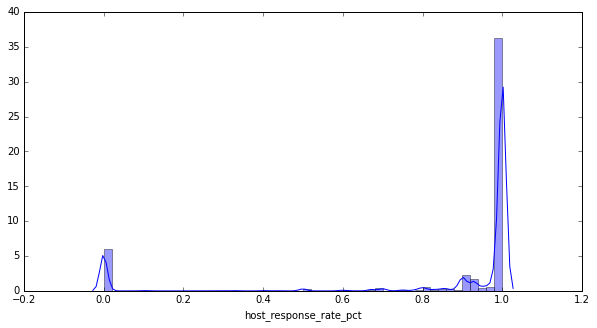

In [55]:
sns.distplot(cleaned_data["host_response_rate_pct"])

##### Clearly there are two distributions for this feature

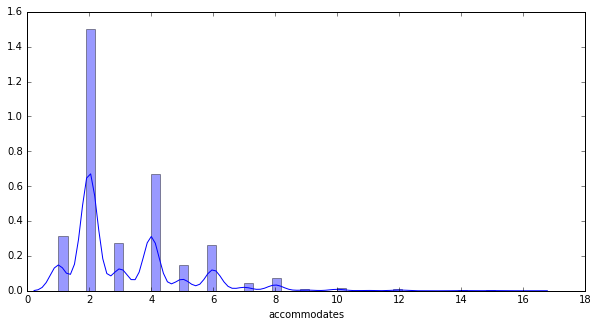

In [56]:
sns.distplot(cleaned_data["accommodates"])

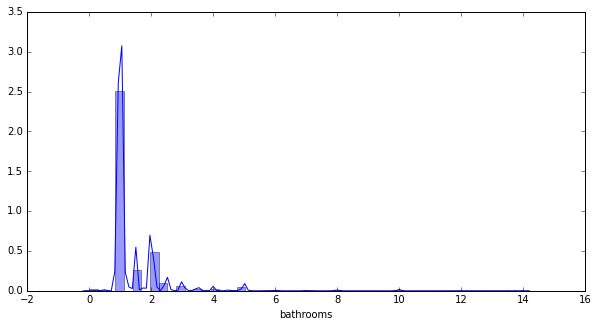

In [57]:
sns.distplot(cleaned_data["bathrooms"])

##### Observations:
1. This is highly skewed so we can drop records with bathrooms greater than 4.

In [58]:
cleaned_data = cleaned_data[cleaned_data["bathrooms"] <= 4]

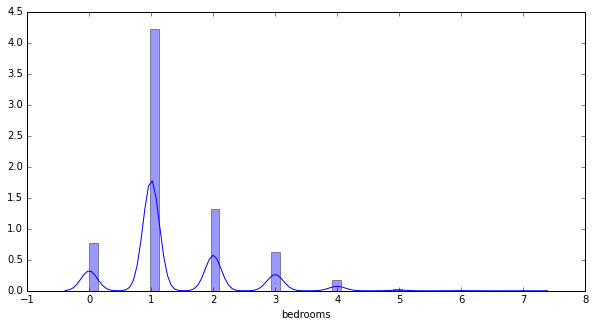

In [59]:
sns.distplot(cleaned_data["bedrooms"])

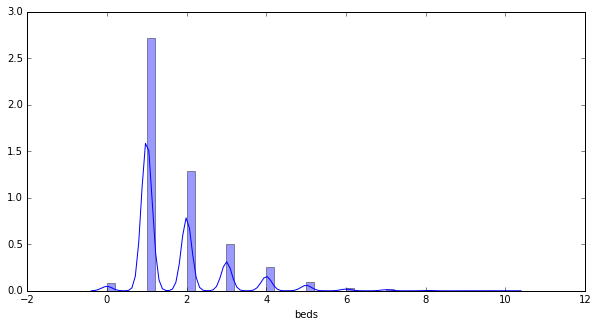

In [60]:
sns.distplot(cleaned_data["beds"])

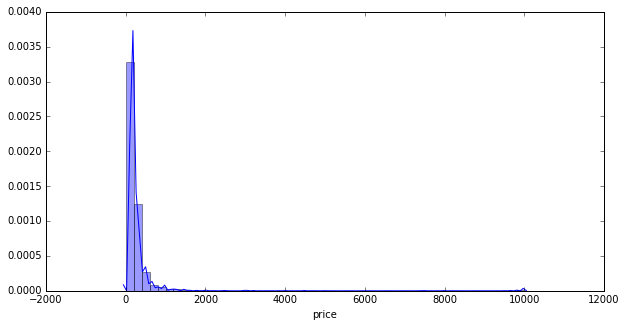

In [61]:
sns.distplot(cleaned_data["price"])

##### The distribution is highly skewed towards the right. Hence we should remove the outlier based on IQR method.

In [62]:
upper_bound = cleaned_data["price"].quantile(0.75) + ((cleaned_data["price"].quantile(0.75) - cleaned_data["price"].quantile(0.25) * 1.5))
print("The upper bound based on IQR is : ", upper_bound)

The upper bound based on IQR is :  340.0


In [63]:
quantile_price = cleaned_data["price"].quantile(np.round(np.arange(0.90, 1.00, 0.01), 2))
qValues = np.round(np.arange(0.90, 1.00, 0.01), 2)
for i in qValues:
    print("{}th percentile value of price is {}".format((int(i*100)), quantile_price[i]))

90th percentile value of price is 395.0
91th percentile value of price is 400.0
92th percentile value of price is 450.0
93th percentile value of price is 475.0
94th percentile value of price is 500.0
95th percentile value of price is 550.0
96th percentile value of price is 600.0
97th percentile value of price is 708.8199999999961
98th percentile value of price is 900.0
99th percentile value of price is 1200.0


In [64]:
quantile_price = cleaned_data["price"].quantile(np.round(np.arange(0.991, 1.001, 0.001), 4))
qValues = np.round(np.arange(0.991, 1.001, 0.001), 4)
for i in qValues:
    print("{}th percentile value of price is {}".format(((i*100)), quantile_price[i]))

99.1th percentile value of price is 1250.0
99.2th percentile value of price is 1324.8400000000074
99.3th percentile value of price is 1478.859999999986
99.4th percentile value of price is 1500.0
99.5th percentile value of price is 1665.9999999999854
99.6th percentile value of price is 2000.0
99.7th percentile value of price is 2598.6040000001594
99.8th percentile value of price is 3206.5999999999804
99.9th percentile value of price is 8131.934000001425
100.0th percentile value of price is 10000.0


In [65]:
cleaned_data["price"].mean() + (3*cleaned_data["price"].std())

1464.497081940343

In [66]:
print("The count of seemingly outlier values is: ", len(cleaned_data[cleaned_data["price"] > cleaned_data["price"].quantile(0.95)]))
print("The percentage of seemingly outlier values is: ", len(cleaned_data[cleaned_data["price"] > cleaned_data["price"].quantile(0.95)]) / len(airbnb_data) )

The count of seemingly outlier values is:  387
The percentage of seemingly outlier values is:  0.0477129823696215


In [67]:
# Dropping the records with price greater than 95th percentile

cleaned_data = cleaned_data[(cleaned_data["price"] > 0) & (cleaned_data["price"] <= cleaned_data["price"].quantile(0.95))] 

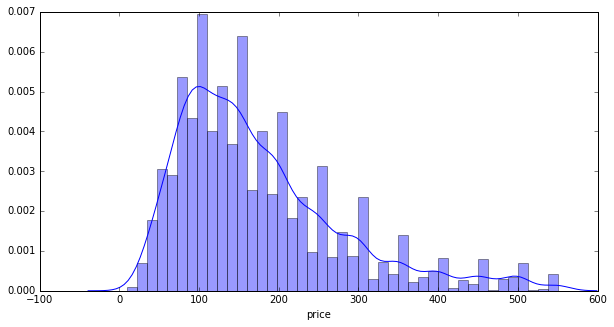

In [68]:
sns.distplot(cleaned_data["price"])

In [69]:
cleaned_data.head()

,host_response_time,host_response_rate_pct,host_is_superhost,host_has_profile_pic,host_identity_verified,neighbourhood,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,price,security_deposit,cleaning_fee,guests_included,extra_people,min_nights,max_nights,number_of_reviews,instant_bookable,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,host_listing_count,listing_duration,host_duration,calculated_reviews_per_month,review_score,host_is_local,host_since_years,amenities_count
0,day,1.00,1,1,1,Western Addition,Apartment,Entire home/apt,3,1.0,1.0,2.0,Real Bed,170.0,100.0,100.0,2,25.0,1,30,217,0,moderate,0,0,1,3735,4092,1.6,9.83,1,2008,32
1,hour,1.00,1,1,1,Inner Sunset,House,Private room,2,1.0,1.0,1.0,Real Bed,99.0,0.0,10.0,2,20.0,1,5,160,0,strict_14_with_grace_period,0,0,3,3742,3962,1.2,10.00,1,2008,30
2,day,0.80,0,1,1,Bernal Heights,Apartment,Entire home/apt,5,1.0,2.0,3.0,Real Bed,235.0,0.0,100.0,2,0.0,30,60,111,0,strict_14_with_grace_period,0,0,1,3816,3878,0.9,9.83,1,2009,17
3,hour,0.86,1,1,1,Haight Ashbury,Apartment,Private room,2,4.0,1.0,1.0,Real Bed,65.0,200.0,50.0,1,12.0,32,60,18,0,strict_14_with_grace_period,0,0,9,3696,3771,0.1,8.50,1,2009,18
4,hour,0.86,1,1,1,Haight Ashbury,Apartment,Private room,2,4.0,1.0,1.0,Real Bed,65.0,200.0,50.0,1,12.0,32,90,8,0,strict_14_with_grace_period,0,0,9,1862,3771,0.1,9.33,1,2009,16


### **3.2 Exploratory Data Analysis**

After the data cleaning steps, we can now perform EDA on the dataset to discover patterns and relationships that will help in understanding the data better.

#### **3.2.1 Univariate Analysis**

Text(0.5, 0, ' ')

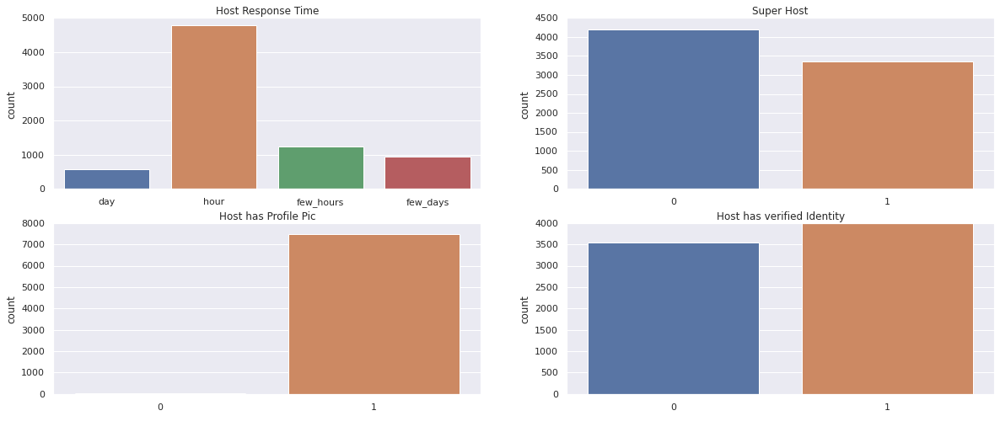

In [70]:
sns.set(style="darkgrid")
plot_objects = plt.subplots(nrows=2, ncols=2, figsize=(20, 8))
fig, ((ax1, ax2), (ax3, ax4)) = plot_objects

sns.countplot(x = "host_response_time", data = cleaned_data, ax=ax1, )
ax1.set_title("Host Response Time")
ax1.set_xlabel(" ")

sns.countplot(x = "host_is_superhost", data = cleaned_data, ax=ax2)
ax2.set_title("Super Host")
ax2.set_xlabel(" ")

sns.countplot(x = "host_has_profile_pic", data = cleaned_data, ax=ax3)
ax3.set_title("Host has Profile Pic")
ax3.set_xlabel(" ")

sns.countplot(x = "host_identity_verified", data = cleaned_data, ax=ax4)
ax4.set_title("Host has verified Identity")
ax4.set_xlabel(" ")

##### Observations: 
1. Most of the hosts respond back within the hour.
2. More than half of the hosts are not super hosts.
3. Most of the hosts have the profile picture. Since the feature is highly skewed, it can be dropped.
4. More than half of the hosts have verified identity. 

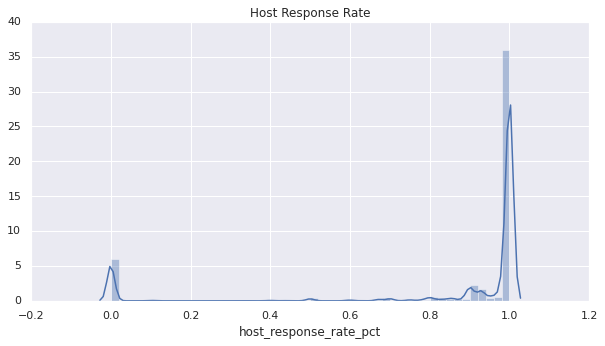

In [71]:
plt.title("Host Response Rate")
sns.distplot(cleaned_data["host_response_rate_pct"])

##### Most of the host respond back.

In [72]:
cleaned_data["neighbourhood"].value_counts()

Mission                  696
Downtown/Civic Center    653
South of Market          636
Western Addition         593
Castro/Upper Market      408
Bernal Heights           380
Haight Ashbury           346
Noe Valley               314
Outer Sunset             295
Nob Hill                 245
Potrero Hill             237
Bayview                  205
Inner Richmond           202
Outer Richmond           180
Marina                   177
Financial District       176
Excelsior                176
Outer Mission            174
Inner Sunset             161
Russian Hill             151
North Beach              141
Pacific Heights          133
West of Twin Peaks       132
Parkside                 127
Ocean View               124
Chinatown                115
Visitacion Valley         78
Lakeshore                 63
Twin Peaks                62
Glen Park                 60
Crocker Amazon            50
Seacliff                  20
Diamond Heights           16
Presidio Heights          16
Golden Gate Pa

##### That is a very high cardinal feature and we have handle it while encoding.

Text(0.5, 0, ' ')

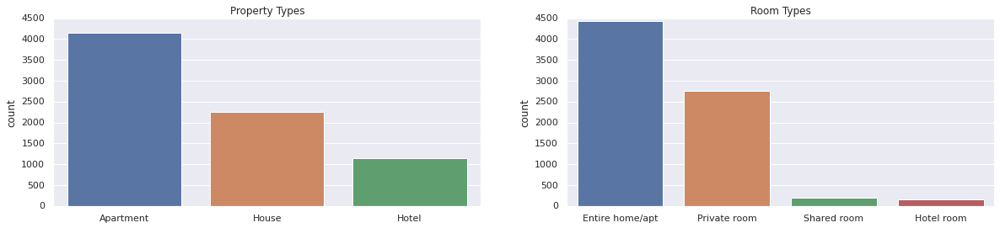

In [73]:
sns.set(style="darkgrid")
plot_objects = plt.subplots(nrows=1, ncols=2, figsize=(20, 4))
fig, (ax1, ax2) = plot_objects

sns.countplot(x = "property_type", data = cleaned_data, ax=ax1)
ax1.set_title("Property Types")
ax1.set_xlabel(" ")

sns.countplot(x = "room_type", data = cleaned_data, ax=ax2)
ax2.set_title("Room Types")
ax2.set_xlabel(" ")

##### Observations:
1. Most of the Property Types are Apartments.
2. Most the room types available for rental are entire home/apt

Text(0.5, 0, ' ')

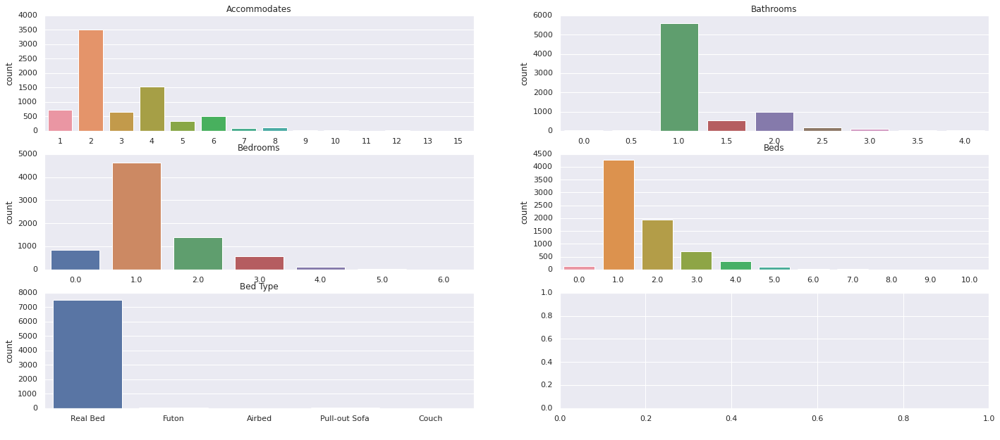

In [74]:
sns.set(style="darkgrid")
plot_objects = plt.subplots(nrows=3, ncols=2, figsize=(24, 10))
fig, ((ax1, ax2), (ax3, ax4), (ax5, ax6)) = plot_objects

sns.countplot(x = "accommodates", data = cleaned_data, ax=ax1)
ax1.set_title("Accommodates")
ax1.set_xlabel(" ")

sns.countplot(x = "bathrooms", data = cleaned_data, ax=ax2)
ax2.set_title("Bathrooms")
ax2.set_xlabel(" ")

sns.countplot(x = "bedrooms", data = cleaned_data, ax=ax3)
ax3.set_title("Bedrooms")
ax3.set_xlabel(" ")

sns.countplot(x = "beds", data = cleaned_data, ax=ax4)
ax4.set_title("Beds")
ax4.set_xlabel(" ")

sns.countplot(x = "bed_type", data = cleaned_data, ax=ax5)
ax5.set_title("Bed Type")
ax5.set_xlabel(" ")

##### Observations
1. Most of the rentals have 2 accommodates.
2. Most of the rentals have 1 bathroom, bedroom and beds.
3. Most of the beds are real beds. Since it is highly skewed, it can be dropped.


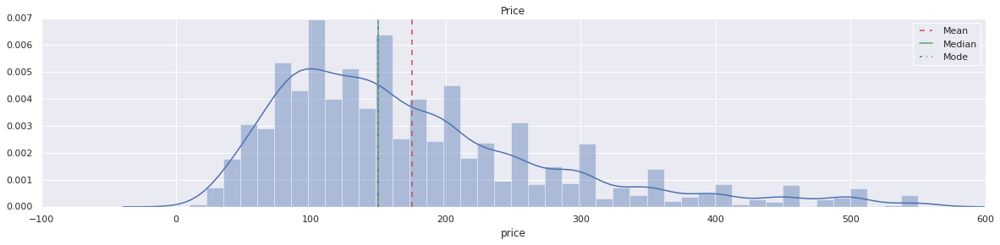

In [75]:
sns.set(style="darkgrid")
plot_objects = plt.subplots(figsize=(20, 4))
fig, axes = plot_objects
plt.title("Price")
sns.distplot(cleaned_data["price"])
axes.axvline(cleaned_data["price"].mean(), color='r', linestyle='--', label = "Mean")
axes.axvline(cleaned_data["price"].median(), color='g', linestyle='-', label = "Median")
axes.axvline(cleaned_data["price"].mode()[0], color='b', linestyle='-.', label = "Mode")
axes.legend()

Text(0.5, 0, ' ')

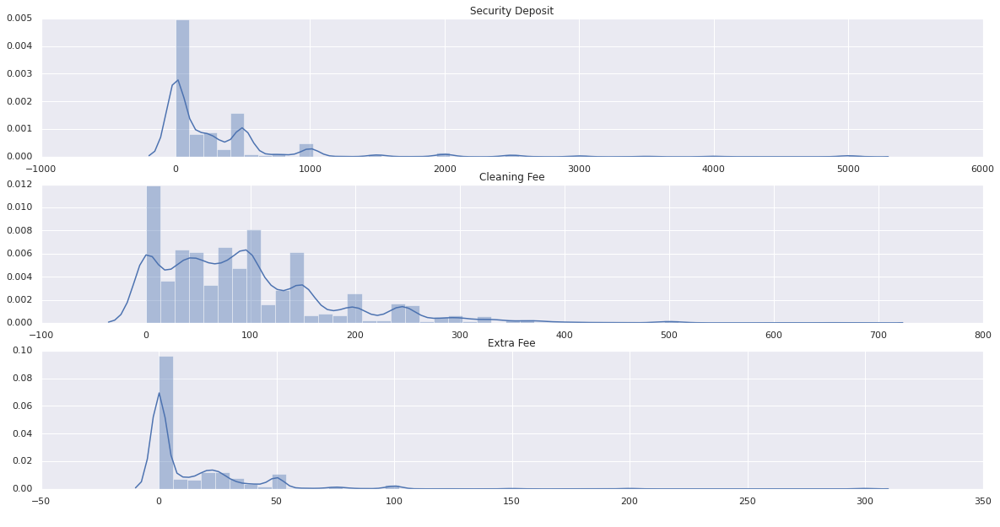

In [76]:
sns.set(style="darkgrid")
plot_objects = plt.subplots(nrows=3, ncols=1, figsize=(20, 10))
fig, (ax1, ax2,  ax3) = plot_objects

sns.distplot(cleaned_data["security_deposit"], ax=ax1)
ax1.set_title("Security Deposit")
ax1.set_xlabel(" ")

sns.distplot(cleaned_data["cleaning_fee"], ax=ax2)
ax2.set_title("Cleaning Fee")
ax2.set_xlabel(" ")

sns.distplot(cleaned_data["extra_people"], ax=ax3)
ax3.set_title("Extra Fee")
ax3.set_xlabel(" ")

##### Observations:
1. All the three features have highly right skewed.

In [77]:
cleaned_data[["security_deposit", "cleaning_fee", "extra_people"]].quantile(.90)

security_deposit    1000.0
cleaning_fee         200.0
extra_people          50.0
Name: 0.9, dtype: float64

In [78]:
cleaned_data = cleaned_data[cleaned_data["security_deposit"] <= cleaned_data["security_deposit"].quantile(0.90)]
cleaned_data = cleaned_data[cleaned_data["cleaning_fee"] <= cleaned_data["cleaning_fee"].quantile(0.90)]
cleaned_data = cleaned_data[cleaned_data["extra_people"] <= cleaned_data["extra_people"].quantile(0.90)]

Text(0.5, 0, ' ')

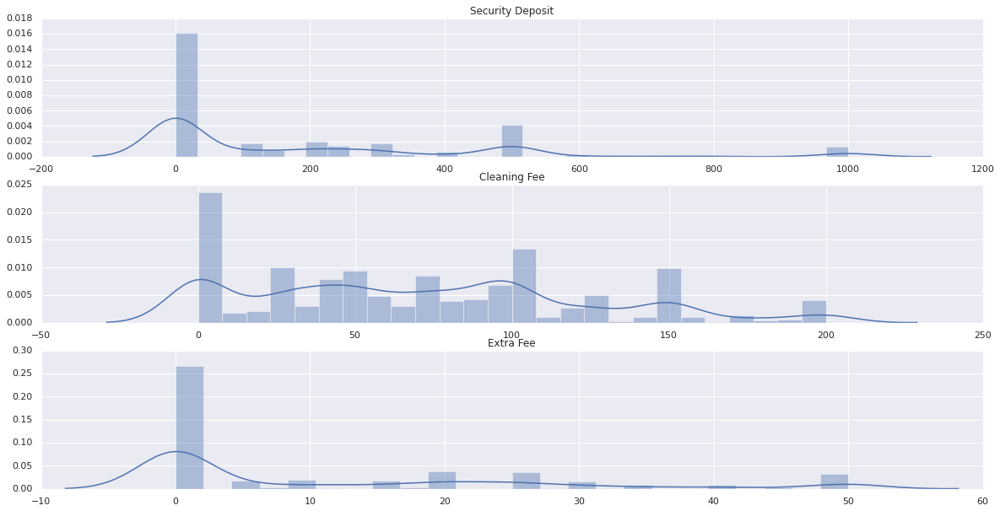

In [79]:
sns.set(style="darkgrid")
plot_objects = plt.subplots(nrows=3, ncols=1, figsize=(20, 10))
fig, (ax1, ax2,  ax3) = plot_objects

sns.distplot(cleaned_data["security_deposit"], ax=ax1)
ax1.set_title("Security Deposit")
ax1.set_xlabel(" ")

sns.distplot(cleaned_data["cleaning_fee"], ax=ax2)
ax2.set_title("Cleaning Fee")
ax2.set_xlabel(" ")

sns.distplot(cleaned_data["extra_people"], ax=ax3)
ax3.set_title("Extra Fee")
ax3.set_xlabel(" ")

Text(0.5, 0, ' ')

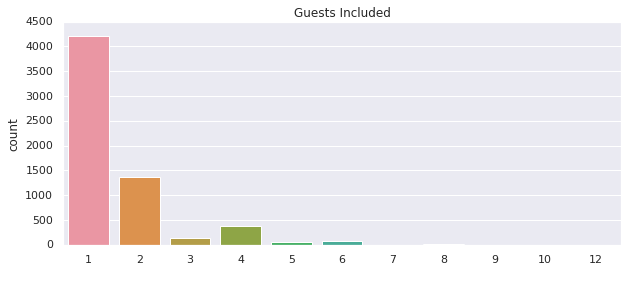

In [80]:
sns.set(style="darkgrid")
plot_objects = plt.subplots(nrows=1, ncols=1, figsize=(10, 4))
fig, ax1 = plot_objects

sns.countplot(x = "guests_included", data = cleaned_data, ax=ax1)
ax1.set_title("Guests Included")
ax1.set_xlabel(" ")

Text(0.5, 0, ' ')

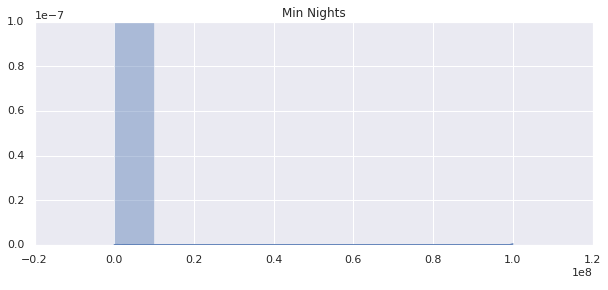

In [81]:
sns.set(style="darkgrid")
plot_objects = plt.subplots(nrows=1, ncols=1, figsize=(10, 4))
fig, ax1 = plot_objects

sns.distplot(cleaned_data["min_nights"], bins=10 , ax=ax1)
ax1.set_title("Min Nights")
ax1.set_xlabel(" ")

In [82]:
np.sort(cleaned_data["min_nights"].unique())

array([        1,         2,         3,         4,         5,         6,
               7,         8,         9,        10,        12,        13,
              14,        15,        16,        18,        21,        25,
              28,        29,        30,        31,        32,        33,
              38,        40,        45,        50,        55,        58,
              60,        75,        80,        85,        90,       100,
             110,       120,       180,       183,       188,       200,
             360,       365,      1000, 100000000])

##### The minimum nights booking seems inappropriate and can be dropped for being outliers.

In [83]:
cleaned_data = cleaned_data[cleaned_data["min_nights"]<=100]

Text(0.5, 0, ' ')

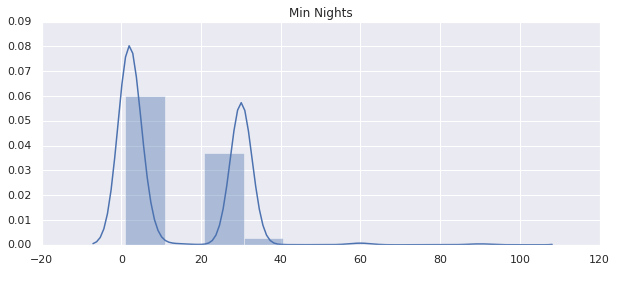

In [84]:
sns.set(style="darkgrid")
plot_objects = plt.subplots(nrows=1, ncols=1, figsize=(10, 4))
fig, ax1 = plot_objects

sns.distplot(cleaned_data["min_nights"], bins=10 , ax=ax1)
ax1.set_title("Min Nights")
ax1.set_xlabel(" ")

##### We can see that there are two distributions for min nights, so we can categorize them as "Short-term" and "Long-Term" can cap it at 30

In [85]:
def Categorize_Min_Nights(x):
    if x < 30:
        return x
    else:
        return 30

cleaned_data["min_nights"] = cleaned_data["min_nights"].apply(Categorize_Min_Nights) 

Text(0.5, 0, ' ')

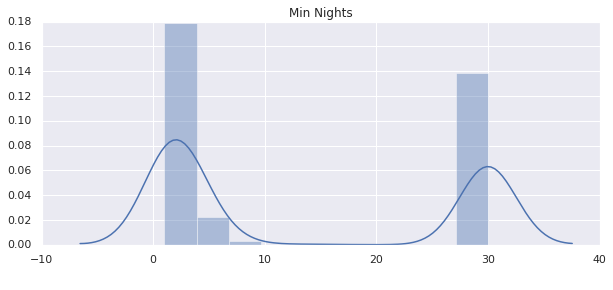

In [86]:
sns.set(style="darkgrid")
plot_objects = plt.subplots(nrows=1, ncols=1, figsize=(10, 4))
fig, ax1 = plot_objects

sns.distplot(cleaned_data["min_nights"], bins=10 , ax=ax1)
ax1.set_title("Min Nights")
ax1.set_xlabel(" ")

Text(0.5, 0, ' ')

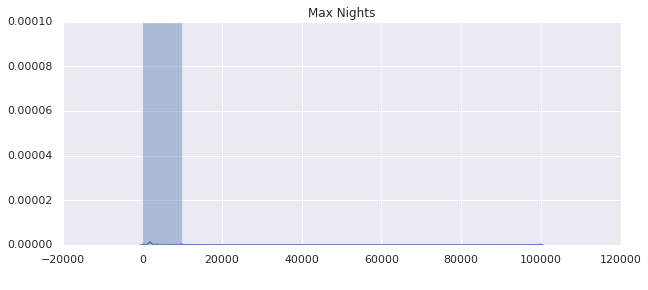

In [87]:
sns.set(style="darkgrid")
plot_objects = plt.subplots(nrows=1, ncols=1, figsize=(10, 4))
fig, ax1 = plot_objects

sns.distplot(cleaned_data["max_nights"], bins=10 , ax=ax1)
ax1.set_title("Max Nights")
ax1.set_xlabel(" ")

In [88]:
np.sort(cleaned_data["max_nights"].unique())

array([     1,      2,      3,      4,      5,      6,      7,      8,
            9,     10,     11,     12,     13,     14,     15,     16,
           17,     18,     19,     20,     21,     22,     23,     24,
           25,     26,     27,     28,     29,     30,     31,     32,
           33,     34,     35,     36,     37,     39,     40,     44,
           45,     50,     51,     54,     55,     59,     60,     61,
           62,     63,     65,     66,     67,     69,     70,     75,
           76,     80,     87,     89,     90,     91,     93,     95,
           98,     99,    100,    102,    107,    110,    112,    120,
          121,    122,    123,    124,    125,    126,    130,    140,
          150,    151,    154,    160,    170,    180,    181,    182,
          183,    184,    186,    188,    190,    200,    208,    210,
          211,    220,    240,    245,    250,    256,    270,    275,
          283,    290,    295,    300,    325,    330,    334,    335,
      

In [89]:
cleaned_data["max_nights"].value_counts().sort_values()

9999         1
154          1
126          1
122          1
102          1
290          1
800          1
39           1
184          1
295          1
256          1
170          1
700          1
283          1
124          1
112          1
335          1
76           1
367          1
44           1
36           1
799          1
208          1
356          1
67           1
140          1
66           1
107          1
325          1
334          1
181          1
121          1
34           1
69           1
37           1
33           1
123          1
151          1
183          1
245          1
65           1
211          1
450          1
1094         1
1118         1
1122         1
425          1
51           1
87           1
54           1
100000       1
55           1
275          2
600          2
17           2
220          2
720          2
98           2
366          2
95           2
350          2
210          2
125          2
188          2
160          2
1123         3
110       

In [90]:
cleaned_data["max_nights"].describe()

count      6235.000000
mean        488.402566
std        1366.634727
min           1.000000
25%          28.000000
50%         120.000000
75%        1125.000000
max      100000.000000
Name: max_nights, dtype: float64

In [91]:
def Categorize_Max_Nights(x):
    if x > 180:
        return 180
    else:
        return x

cleaned_data["max_nights"] = cleaned_data["max_nights"].apply(Categorize_Max_Nights)

##### Similar to feature "min_night", categorized the "max_nights" as well as it also looked to contain outlier values.

Text(0.5, 0, ' ')

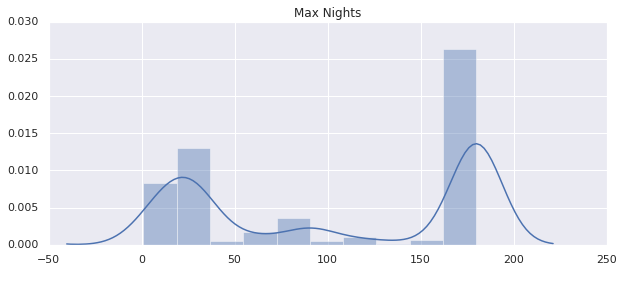

In [92]:
sns.set(style="darkgrid")
plot_objects = plt.subplots(nrows=1, ncols=1, figsize=(10, 4))
fig, ax1 = plot_objects

sns.distplot(cleaned_data["max_nights"], bins=10 , ax=ax1)
ax1.set_title("Max Nights")
ax1.set_xlabel(" ")

Text(0.5, 0, ' ')

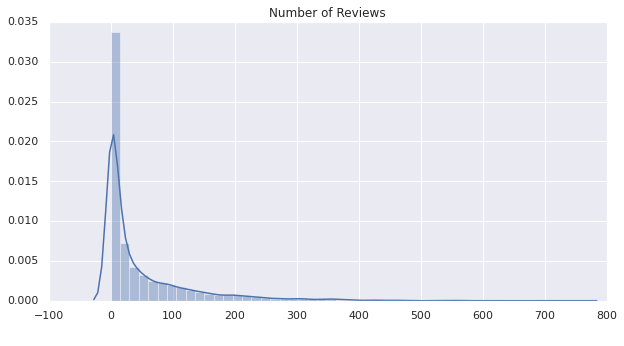

In [93]:
sns.set(style="darkgrid")
plot_objects = plt.subplots(nrows=1, ncols=1, figsize=(10, 5))
fig, ax1 = plot_objects

sns.distplot(cleaned_data["number_of_reviews"], ax=ax1)
ax1.set_title("Number of Reviews")
ax1.set_xlabel(" ")

##### The feature "number of reviews" is highly right skewed and we need to transform this feature to bring it some what close to normal distribution. 

Text(0.5, 0, ' ')

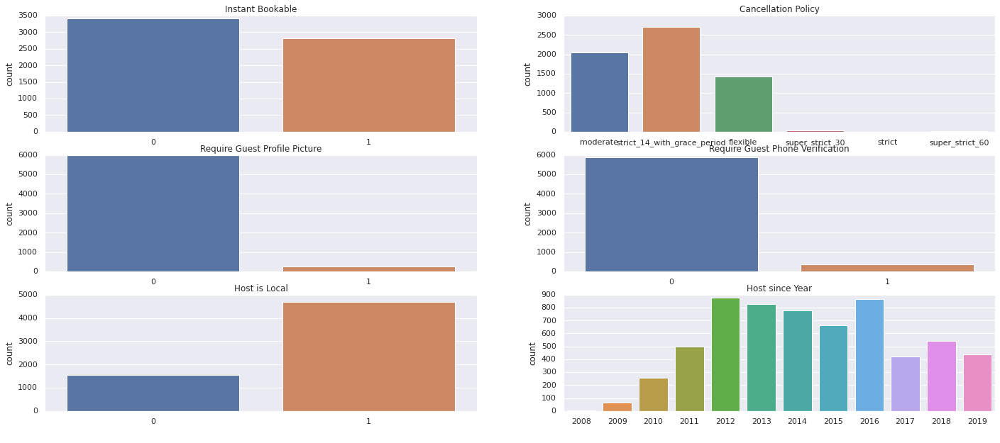

In [94]:
sns.set(style="darkgrid")
plot_objects = plt.subplots(nrows=3, ncols=2, figsize=(24, 10))
fig, ((ax1, ax2), (ax3, ax4), (ax5, ax6)) = plot_objects

sns.countplot(x = "instant_bookable", data = cleaned_data, ax=ax1)
ax1.set_title("Instant Bookable")
ax1.set_xlabel(" ")

sns.countplot(x = "cancellation_policy", data = cleaned_data, ax=ax2)
ax2.set_title("Cancellation Policy")
ax2.set_xlabel(" ")

sns.countplot(x = "require_guest_profile_picture", data = cleaned_data, ax=ax3)
ax3.set_title("Require Guest Profile Picture")
ax3.set_xlabel(" ")

sns.countplot(x = "require_guest_phone_verification", data = cleaned_data, ax=ax4)
ax4.set_title("Require Guest Phone Verification")
ax4.set_xlabel(" ")

sns.countplot(x = "host_is_local", data = cleaned_data, ax=ax5)
ax5.set_title("Host is Local")
ax5.set_xlabel(" ")

sns.countplot(x = "host_since_years", data = cleaned_data, ax=ax6)
ax6.set_title("Host since Year")
ax6.set_xlabel(" ")

##### Observations:
1. The "instant booking" seems be quite balanced.
2. The "cancellation policy" has few "strict" labels that can be combined to reduce cardinality.
3. Most of the rentals do not require guest profile picture or guest phone verification.
4. Most of the hosts are local and they have hosts for ~5 years




In [95]:
def CancellationPolicyCategorizaton(x):
    if x in ['super_strict_30', 'strict', 'super_strict_60']:
        return "strict"
    else:
        return x

cleaned_data["cancellation_policy"] = cleaned_data["cancellation_policy"].apply(CancellationPolicyCategorizaton)

Text(0.5, 0, ' ')

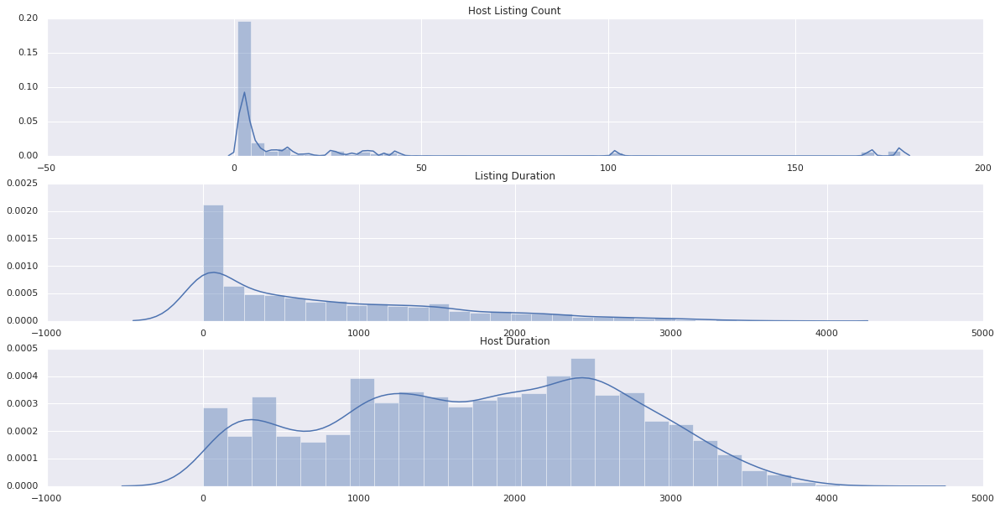

In [96]:
sns.set(style="darkgrid")
plot_objects = plt.subplots(nrows=3, ncols=1, figsize=(20, 10))
fig, (ax1, ax2,  ax3) = plot_objects

sns.distplot(cleaned_data["host_listing_count"], ax=ax1)
ax1.set_title("Host Listing Count")
ax1.set_xlabel(" ")

sns.distplot(cleaned_data["listing_duration"], ax=ax2)
ax2.set_title("Listing Duration")
ax2.set_xlabel(" ")

sns.distplot(cleaned_data["host_duration"], ax=ax3)
ax3.set_title("Host Duration")
ax3.set_xlabel(" ")

##### Observations:
1. The "host listing count" is very skewed and may have to be transformed.
2. A large rentals listing seems to be recent given the skewed distribution.
3. The host duration seems to look fine.

Text(0.5, 0, ' ')

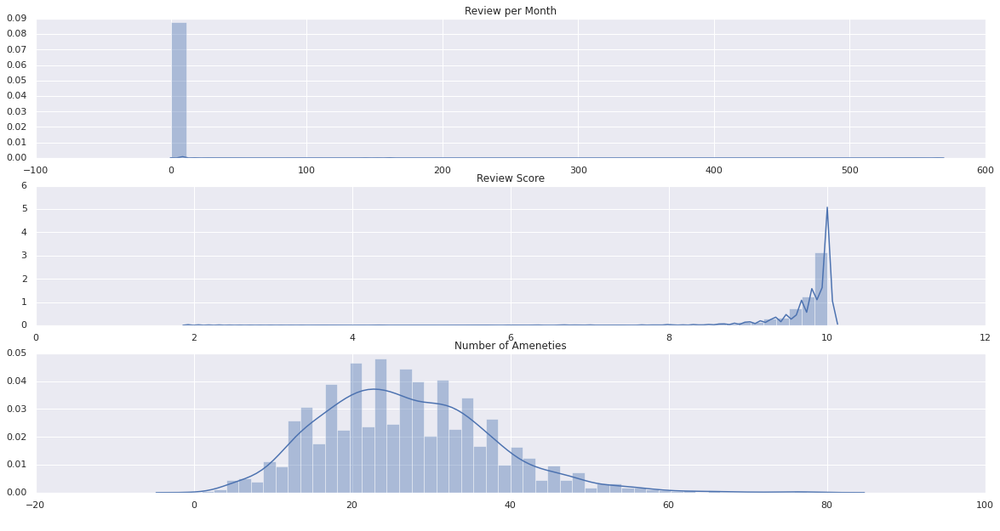

In [97]:
sns.set(style="darkgrid")
plot_objects = plt.subplots(nrows=3, ncols=1, figsize=(20, 10))
fig, (ax1, ax2,  ax3) = plot_objects

sns.distplot(cleaned_data["calculated_reviews_per_month"], ax=ax1)
ax1.set_title("Review per Month")
ax1.set_xlabel(" ")

sns.distplot(cleaned_data["review_score"], ax=ax2)
ax2.set_title("Review Score")
ax2.set_xlabel(" ")

sns.distplot(cleaned_data["amenities_count"], ax=ax3)
ax3.set_title("Number of Ameneties")
ax3.set_xlabel(" ")

##### Observations:
1. The "review per month" has a large portion as 0 which means there are no reviews for the feature.
2. The "review score" seems to be left skewed and most of the values are around 10.
3. The "number of ameneties" seems to follow normal distribution

In [98]:
# Dropping highly skewed categorical features.
cleaned_data = cleaned_data.drop(labels=["host_has_profile_pic", "bed_type", "require_guest_profile_picture", "require_guest_phone_verification"], axis=1)

#### **3.2.2 Bivariate Analysis**

Analyzing two features at a time, finding relations and correlations and remove multicolinear features.

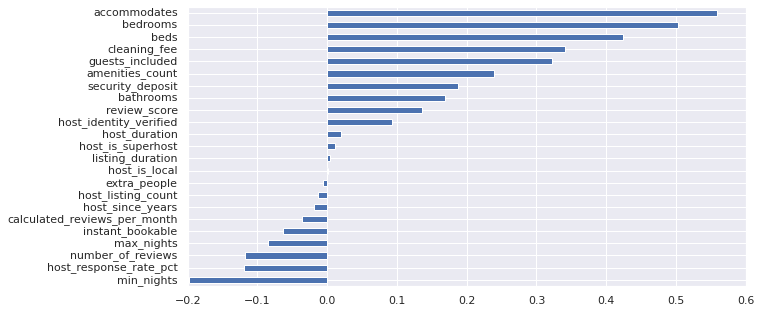

In [99]:
# Correlaton of independent numerical features with dependent feature

plt.figure(figsize=(10,5))
cleaned_data.corr()["price"].sort_values().iloc[:-1].plot.barh()

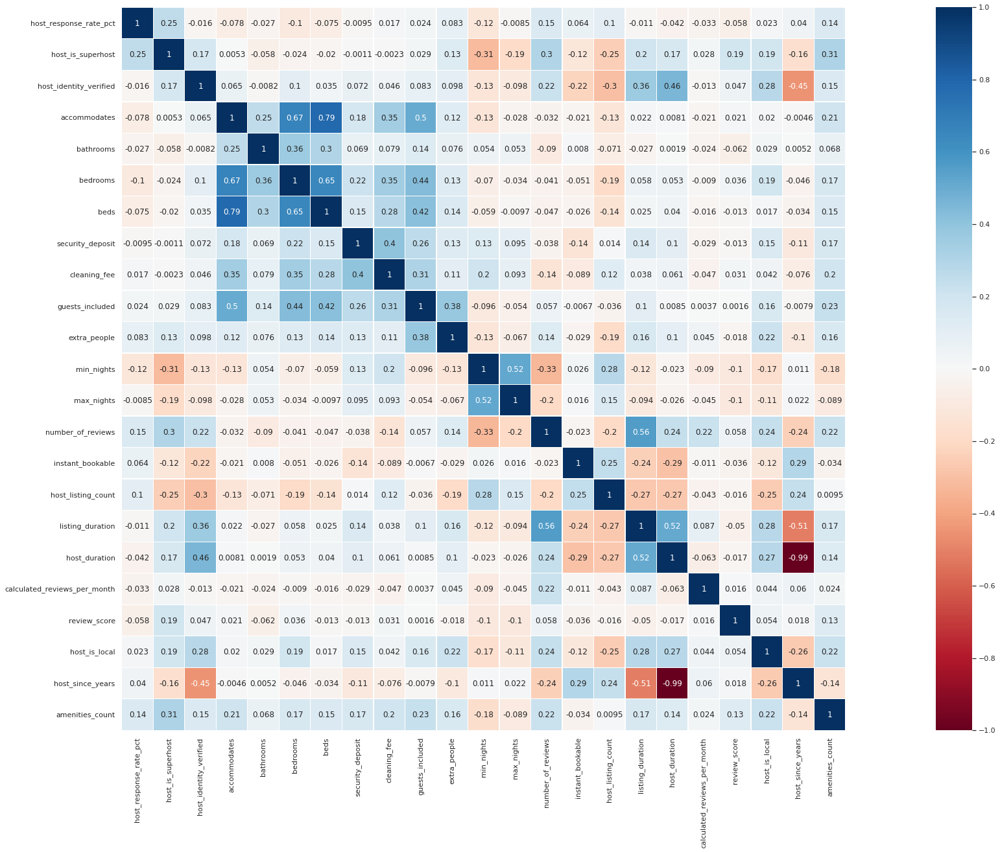

In [100]:
# Heatmap to identify multicolinearity

plt.figure(figsize=(50,20))
sns.heatmap(cleaned_data.drop(columns='price', axis=1).corr(), vmax=1, vmin=-1, cmap='RdBu', square=True, annot=True, linewidth=0.3);

##### There are many highly correlated features, so we have to extract those greater than 0.75 and drop one of them to reduce the dimensions.

In [101]:
# Correlation Matrix melting
corr_matrix = cleaned_data.drop(columns=['price']).corr()

cols = corr_matrix.columns
corr_matrix.reset_index(inplace=True)
corr_matrix = corr_matrix.melt(id_vars='index', value_vars=cols)

print(corr_matrix.shape)
corr_matrix.head()

(529, 3)


,index,variable,value
0,host_response_rate_pct,host_response_rate_pct,1.000000
1,host_is_superhost,host_response_rate_pct,0.251394
2,host_identity_verified,host_response_rate_pct,-0.015715
3,accommodates,host_response_rate_pct,-0.078096
4,bathrooms,host_response_rate_pct,-0.027249


In [102]:
# sort values > 0.8
corr_matrix = corr_matrix[corr_matrix['index'] != corr_matrix['variable']]
corr_matrix = corr_matrix[corr_matrix['value'].abs() > 0.75]

print(corr_matrix.shape)
corr_matrix

(4, 3)


,index,variable,value
75,beds,accommodates,0.788666
141,accommodates,beds,0.788666
412,host_since_years,host_duration,-0.993678
500,host_duration,host_since_years,-0.993678


##### Based on the above pairs, we can drop one of them to remove multicolinearity.

Dropping "beds", "require_guest_phone_verification" and "host_duration"

In [103]:
cleaned_data = cleaned_data.drop(labels=["beds", "host_duration"], axis=1)

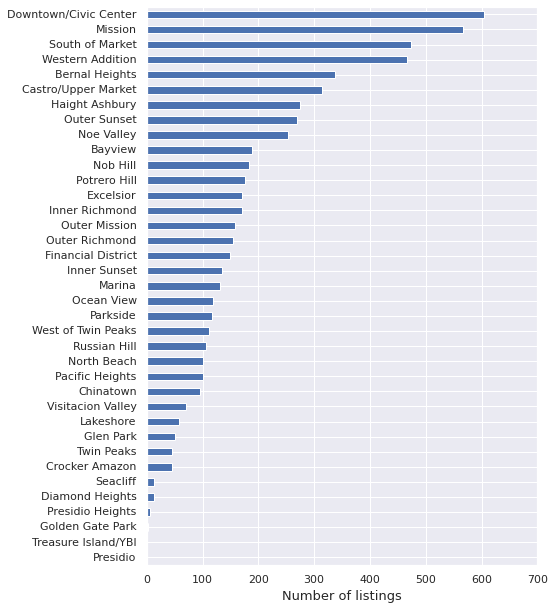

In [104]:
plt.figure(figsize=(7,10))
cleaned_data.neighbourhood.value_counts(ascending=True).plot.barh()
plt.xlabel('Number of listings', size=13);

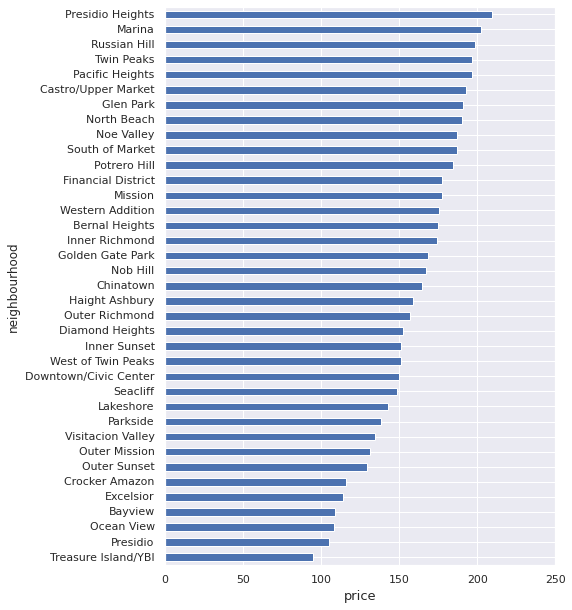

In [105]:
plt.figure(figsize=(7,10))
cleaned_data.groupby("neighbourhood")["price"].mean().sort_values().plot.barh()
plt.xlabel('price', size=13);

##### Observations:
1. We can notice that Mission district has more listing than any other one with average price a bit higher that average price around the city.
2. We can notice that Marina has the highest average price, but not so many offers on Airbnb.

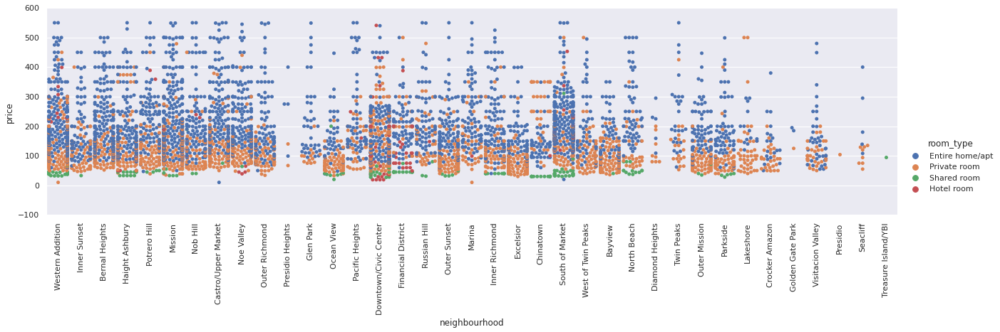

In [106]:
# Plotting Neighbourdhood with Price

sns.catplot(x="neighbourhood", y="price", hue="room_type", kind="swarm", data=cleaned_data, height=5, aspect=25/7)
plt.xticks(rotation=90);

##### Observations:
1. Western Addition and South Market tend to have more listings with price > $300.

2. Most listings above price > $100 are 'entire home/apt' type followed by private room, hotel room and shared room which is the cheapest.

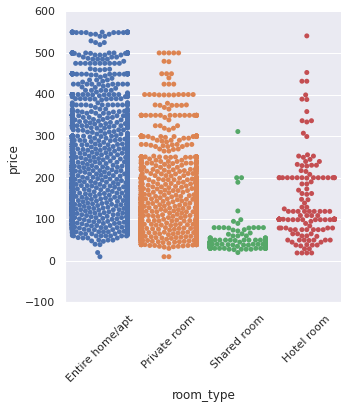

In [107]:
# Plotting Room type with Price

sns.catplot(x="room_type", y="price", data=cleaned_data, kind="swarm")
plt.xticks(rotation=45);

##### Observations:
1. The most expensive and most popular type of room on Airbnb in San Francisco is 'entire home/apt'
2. The cheapest type of room is "shared"

### **3.3 Feature Engineering**

#### **3.3.1 Handling Categorical Features**

We will be using Lable Encoding and One-hot Encoding to encode the categorical features and preparing two datasets, one for tree-based regressors and another for linear regressors.

In [109]:
num_features = cleaned_data.dtypes[cleaned_data.dtypes != 'object'].index.tolist()
cat_features = cleaned_data.dtypes[cleaned_data.dtypes == 'object'].index.tolist()

In [112]:
cleaned_data[cat_features].head()

,host_response_time,neighbourhood,property_type,room_type,cancellation_policy
0,day,Western Addition,Apartment,Entire home/apt,moderate
1,hour,Inner Sunset,House,Private room,strict_14_with_grace_period
2,day,Bernal Heights,Apartment,Entire home/apt,strict_14_with_grace_period
3,hour,Haight Ashbury,Apartment,Private room,strict_14_with_grace_period
4,hour,Haight Ashbury,Apartment,Private room,strict_14_with_grace_period


##### Reducing the cardinality of the "neighbourhood" feature by clubbing less frequent categories.

In [125]:
neighbours = cleaned_data["neighbourhood"].value_counts()

In [135]:
def Reduce_Neighbours(x):
    if x in neighbours[neighbours<50].index:
        return "Others"
    else:
        return x

In [136]:
cleaned_data["neighbourhood"] = cleaned_data["neighbourhood"].apply(Reduce_Neighbours)

In [144]:
cleaned_data.reset_index(inplace=True)
cleaned_data.pop("index")

0          0
1          1
2          2
3          3
4          4
        ... 
6230    8105
6231    8107
6232    8108
6233    8109
6234    8110
Name: index, Length: 6235, dtype: int64

##### Label Encoding of the categorical features

In [145]:
le1 = LabelEncoder()
host_response_time = le1.fit_transform(cleaned_data["host_response_time"])

le2 = LabelEncoder()
neighbourhood = le2.fit_transform(cleaned_data["neighbourhood"])

le3 = LabelEncoder()
property_type = le3.fit_transform(cleaned_data["property_type"])

le4 = LabelEncoder()
room_type = le4.fit_transform(cleaned_data["room_type"])

le5 = LabelEncoder()
cancellation_type = le5.fit_transform(cleaned_data["cancellation_policy"])

##### One-hot encoding

In [146]:
ohe1 = OneHotEncoder()
host_response_time_ohe = ohe1.fit_transform(host_response_time.reshape(-1,1))
host_response_time_ohe = pd.DataFrame(host_response_time_ohe.toarray(), columns = le1.classes_)

ohe2 = OneHotEncoder()
neighbourhood_ohe = ohe2.fit_transform(neighbourhood.reshape(-1,1))
neighbourhood_ohe = pd.DataFrame(neighbourhood_ohe.toarray(), columns = le2.classes_)

ohe3 = OneHotEncoder()
property_type_ohe = ohe3.fit_transform(property_type.reshape(-1,1))
property_type_ohe = pd.DataFrame(property_type_ohe.toarray(), columns = le3.classes_)

ohe4 = OneHotEncoder()
room_type_ohe = ohe4.fit_transform(room_type.reshape(-1,1))
room_type_ohe = pd.DataFrame(room_type_ohe.toarray(), columns = le4.classes_)

ohe5 = OneHotEncoder()
cancellation_type_ohe = ohe5.fit_transform(cancellation_type.reshape(-1,1))
cancellation_type_ohe = pd.DataFrame(cancellation_type_ohe.toarray(), columns = le5.classes_)

##### Concatenating the features to prepare data for ML algorithms.

In [147]:
data_for_tree = pd.concat([cleaned_data[num_features], host_response_time_ohe, neighbourhood_ohe, property_type_ohe, room_type_ohe, cancellation_type_ohe], axis = 1)

In [148]:
host_response_time_ohe.drop([host_response_time_ohe.columns[len(host_response_time_ohe.columns)-1]], axis=1, inplace = True)
neighbourhood_ohe.drop([neighbourhood_ohe.columns[len(neighbourhood_ohe.columns)-1]], axis=1, inplace = True)
property_type_ohe.drop([property_type_ohe.columns[len(property_type_ohe.columns)-1]], axis=1, inplace = True)
room_type_ohe.drop([room_type_ohe.columns[len(room_type_ohe.columns)-1]], axis=1, inplace = True)
cancellation_type_ohe.drop([cancellation_type_ohe.columns[len(cancellation_type_ohe.columns)-1]], axis=1, inplace = True)

##### Dropping last columns(labels) to avoid overfitting and reduce dimension.

In [149]:
data_for_lr = pd.concat([cleaned_data[num_features], host_response_time_ohe, neighbourhood_ohe, property_type_ohe, room_type_ohe, cancellation_type_ohe], axis = 1)

#### **3.3.2 Feature Transfomation**

Transforming some of the highly skewed features

Text(0.5, 0, ' ')

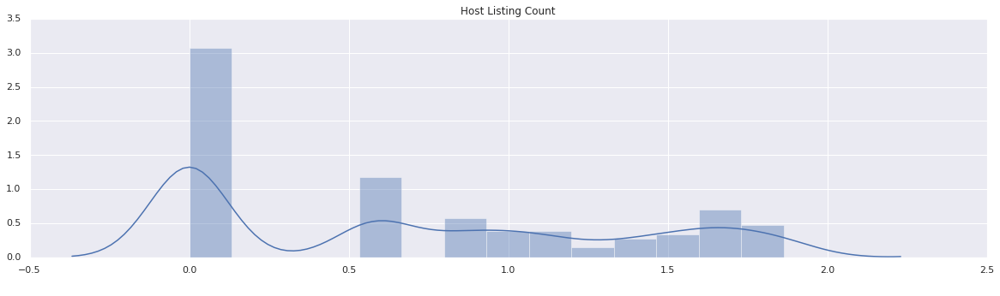

In [161]:
sns.set(style="darkgrid")
plot_objects = plt.subplots(nrows=1, ncols=1, figsize=(20, 5))
fig, ax1 = plot_objects
fitted_data, fitted_lambda = stats.boxcox(data_for_lr["host_listing_count"]) 
sns.distplot(fitted_data, ax=ax1)
ax1.set_title("Host Listing Count")
ax1.set_xlabel(" ")

Text(0.5, 0, ' ')

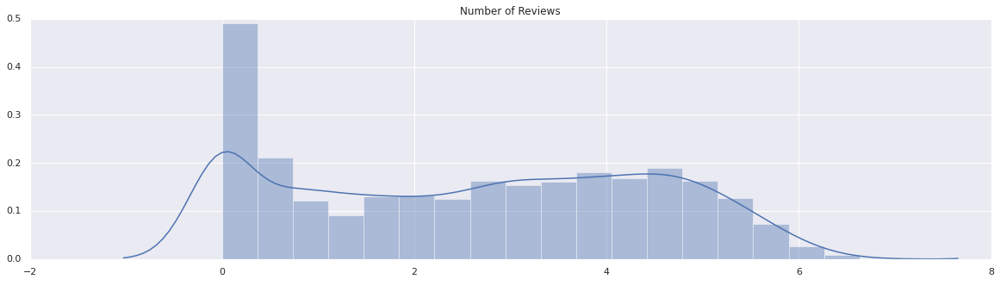

In [167]:
sns.set(style="darkgrid")
plot_objects = plt.subplots(nrows=1, ncols=1, figsize=(20, 5))
fig, ax1 = plot_objects
sns.distplot(np.log1p(data_for_lr["number_of_reviews"]), ax=ax1)
ax1.set_title("Number of Reviews")
ax1.set_xlabel(" ")

Text(0.5, 0, ' ')

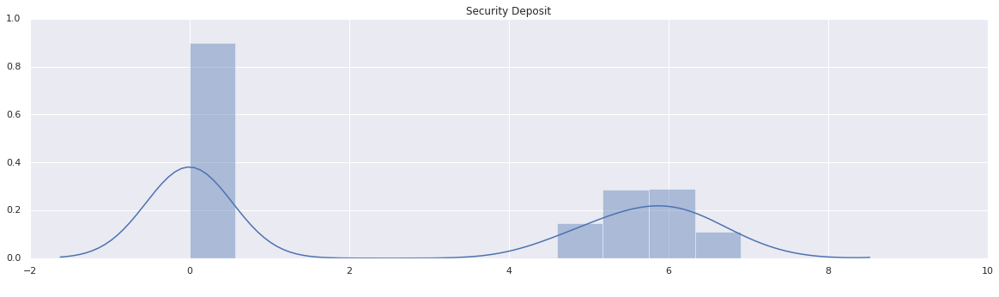

In [173]:
sns.set(style="darkgrid")
plot_objects = plt.subplots(nrows=1, ncols=1, figsize=(20, 5))
fig, ax1 = plot_objects
sns.distplot(np.log1p(data_for_lr["security_deposit"]), ax=ax1)
ax1.set_title("Security Deposit")
ax1.set_xlabel(" ")

Text(0.5, 0, ' ')

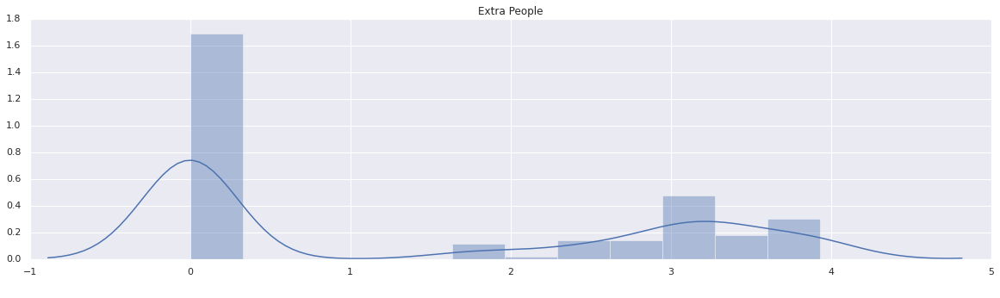

In [179]:
sns.set(style="darkgrid")
plot_objects = plt.subplots(nrows=1, ncols=1, figsize=(20, 5))
fig, ax1 = plot_objects
sns.distplot(np.log1p(data_for_lr["extra_people"]), ax=ax1)
ax1.set_title("Extra People")
ax1.set_xlabel(" ")

Text(0.5, 0, ' ')

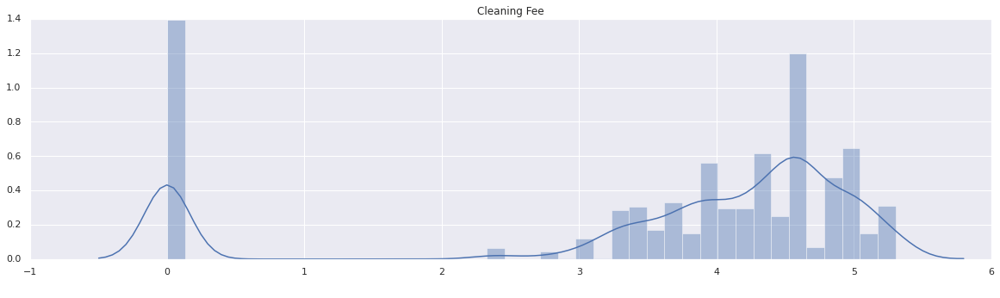

In [180]:
sns.set(style="darkgrid")
plot_objects = plt.subplots(nrows=1, ncols=1, figsize=(20, 5))
fig, ax1 = plot_objects
sns.distplot(np.log1p(data_for_lr["cleaning_fee"]), ax=ax1)
ax1.set_title("Cleaning Fee")
ax1.set_xlabel(" ")

In [181]:
data_for_lr["host_listing_count"] = fitted_data
data_for_lr["number_of_reviews"] = np.log1p(data_for_lr["number_of_reviews"])
data_for_lr["security_deposit"] = np.log1p(data_for_lr["security_deposit"])
data_for_lr["extra_people"] = np.log1p(data_for_lr["extra_people"])
data_for_lr["cleaning_fee"] = np.log1p(data_for_lr["cleaning_fee"])

#### **3.3.3 Feature Scaling**

Scaling the features to prepare the data for ML algos.

In [182]:
#cols to stanndatize
cols_to_standart = data_for_lr[num_features].mean()[data_for_lr[num_features].mean() > 1].index.tolist()
cols_to_standart

['accommodates',
 'bathrooms',
 'bedrooms',
 'price',
 'security_deposit',
 'cleaning_fee',
 'guests_included',
 'extra_people',
 'min_nights',
 'max_nights',
 'number_of_reviews',
 'listing_duration',
 'calculated_reviews_per_month',
 'review_score',
 'host_since_years',
 'amenities_count']

In [184]:
std = StandardScaler()
data_for_lr_std = pd.DataFrame(std.fit_transform(data_for_lr[cols_to_standart]), columns=cols_to_standart)
print(data_for_lr_std.shape)
data_for_lr_std.head()

(6235, 16)


,accommodates,bathrooms,bedrooms,price,security_deposit,cleaning_fee,guests_included,extra_people,min_nights,max_nights,number_of_reviews,listing_duration,calculated_reviews_per_month,review_score,host_since_years,amenities_count
0,0.080356,-0.425643,-0.238142,0.051331,0.628184,0.623023,0.402831,1.164546,-0.909746,-1.016840,1.494509,3.642867,0.052677,0.162314,-2.497051,0.485344
1,-0.553844,-0.425643,-0.238142,-0.664916,-0.951904,-0.647693,0.402831,1.031239,-0.909746,-1.352335,1.330963,3.651547,0.004738,0.492440,-2.497051,0.299664
2,1.348754,-0.425643,1.092338,0.707051,-0.951904,0.623023,0.402831,-0.869080,1.216428,-0.614247,1.135140,3.743308,-0.031216,0.162314,-2.107609,-0.907257
3,-0.553844,5.447954,-0.238142,-1.007908,0.863799,0.231419,-0.528099,0.731900,1.216428,-0.614247,0.177864,3.594506,-0.127095,-2.420435,-2.107609,-0.814417
4,-0.553844,5.447954,-0.238142,-1.007908,0.863799,0.231419,-0.528099,0.731900,1.216428,-0.211654,-0.225330,1.320322,-0.127095,-0.808644,-2.107609,-1.000097


In [185]:
data_for_lr = data_for_lr.drop(columns=cols_to_standart)
data_for_lr = data_for_lr.merge(data_for_lr_std, left_index=True, right_index=True, how='left')
print(data_for_lr.shape)
data_for_lr.head()

(6235, 62)


,host_response_rate_pct,host_is_superhost,host_identity_verified,instant_bookable,host_listing_count,host_is_local,day,few_days,few_hours,Bayview,Bernal Heights,Castro/Upper Market,Chinatown,Downtown/Civic Center,Excelsior,Financial District,Glen Park,Haight Ashbury,Inner Richmond,Inner Sunset,Lakeshore,Marina,Mission,Nob Hill,Noe Valley,North Beach,Ocean View,Others,Outer Mission,Outer Richmond,Outer Sunset,Pacific Heights,Parkside,Potrero Hill,Russian Hill,South of Market,Visitacion Valley,West of Twin Peaks,Apartment,Hotel,Entire home/apt,Hotel room,Private room,flexible,moderate,strict,accommodates,bathrooms,bedrooms,price,security_deposit,cleaning_fee,guests_included,extra_people,min_nights,max_nights,number_of_reviews,listing_duration,calculated_reviews_per_month,review_score,host_since_years,amenities_count
0,1.00,1,1,0,0.000000,1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.080356,-0.425643,-0.238142,0.051331,0.628184,0.623023,0.402831,1.164546,-0.909746,-1.016840,1.494509,3.642867,0.052677,0.162314,-2.497051,0.485344
1,1.00,1,1,0,0.847142,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,-0.553844,-0.425643,-0.238142,-0.664916,-0.951904,-0.647693,0.402831,1.031239,-0.909746,-1.352335,1.330963,3.651547,0.004738,0.492440,-2.497051,0.299664
2,0.80,0,1,0,0.000000,1,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.348754,-0.425643,1.092338,0.707051,-0.951904,0.623023,0.402831,-0.869080,1.216428,-0.614247,1.135140,3.743308,-0.031216,0.162314,-2.107609,-0.907257
3,0.86,1,1,0,1.338589,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,-0.553844,5.447954,-0.238142,-1.007908,0.863799,0.231419,-0.528099,0.731900,1.216428,-0.614247,0.177864,3.594506,-0.127095,-2.420435,-2.107609,-0.814417
4,0.86,1,1,0,1.338589,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,-0.553844,5.447954,-0.238142,-1.007908,0.863799,0.231419,-0.528099,0.731900,1.216428,-0.211654,-0.225330,1.320322,-0.127095,-0.808644,-2.107609,-1.000097


## **4. Model Building**

Since the data has been prepare we can start the model building and try to obtain the best suited algorithm.

### **4.1 Train/test Splitting**

We can split the data for train/test and segregate the independent and dependent features.

In [186]:
X_lr = data_for_lr.drop(["price"], axis=1)
y_lr = data_for_lr[["price"]]

X_tree = data_for_tree.drop(["price"], axis=1)
y_tree = data_for_tree[["price"]]

In [195]:
X_lr_train, X_lr_test, y_lr_train, y_lr_test = train_test_split(X_lr.values, y_lr.values, test_size=0.2, random_state=42)
print('X_train.shape: ', X_lr_train.shape, '\tX_test.shape: ', X_lr_test.shape, '\nY_train.shape: ', y_lr_train.shape, '\tY_test.shape: ', y_lr_test.shape)

X_train.shape:  (4988, 61) 	X_test.shape:  (1247, 61) 
Y_train.shape:  (4988, 1) 	Y_test.shape:  (1247, 1)


In [194]:
X_tree_train, X_tree_test, y_tree_train, y_tree_test = train_test_split(X_tree.values, y_tree.values, test_size=0.2, random_state=42)
print('X_train.shape: ', X_tree_train.shape, '\tX_test.shape: ', X_tree_test.shape, '\nY_train.shape: ', y_tree_train.shape, '\tY_test.shape: ', y_tree_test.shape)

X_train.shape:  (4988, 66) 	X_test.shape:  (1247, 66) 
Y_train.shape:  (4988, 1) 	Y_test.shape:  (1247, 1)


### **4.2 Model Fitting**

In [192]:
def fcnPrintErrorMetrics(y_test, y_pred):
    print('R2:', metrics.r2_score(y_test, y_pred))
    print('MAE:', metrics.mean_absolute_error(y_test, y_pred))
    print('MSE:', metrics.mean_squared_error(y_test, y_pred))
    print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

    sns.set(style="darkgrid")
    plot_objects = plt.subplots(nrows=1, ncols=1, figsize=(20, 5))
    fig, ax1 = plot_objects
    sns.distplot(y_test - y_pred, ax=ax1)
    ax1.set_title("Cleaning Fee")
    ax1.set_xlabel(" ")

R2: 0.5509473654638499
MAE: 0.4949511159828157
MSE: 0.4547507588990596
RMSE: 0.6743521030582315


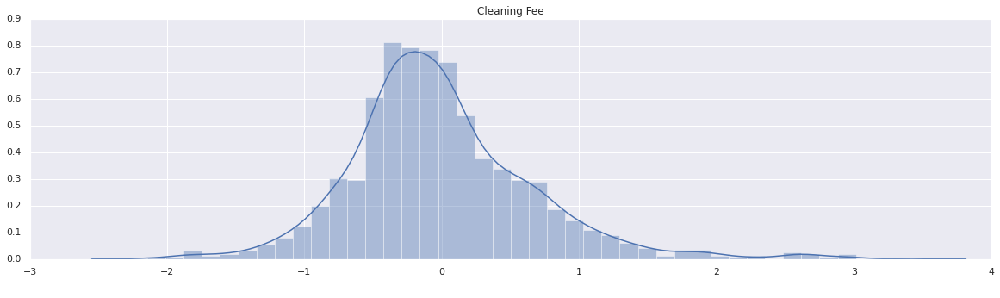

In [199]:
lin_reg = LinearRegression()
lin_reg.fit(X_lr_train, y_lr_train)
y_pred1 = lin_reg.predict(X_lr_test)

fcnPrintErrorMetrics(y_lr_test, y_pred1)

R2: 0.5509883946451357
MAE: 0.4949188721413441
MSE: 0.4547092090897682
RMSE: 0.6743212951477717


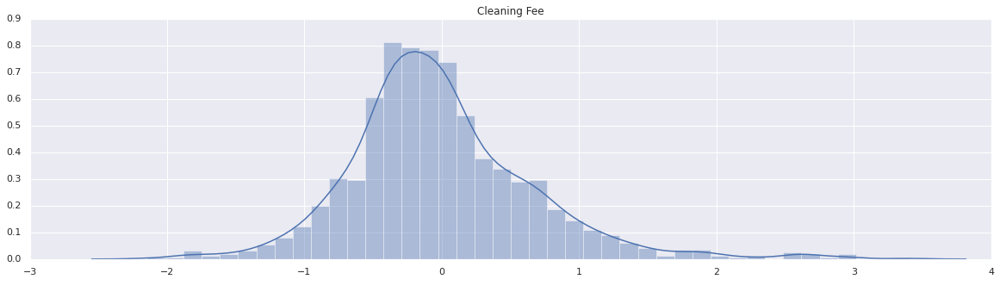

In [202]:
ridge_reg = Ridge(alpha=0.1)
ridge_reg.fit(X_lr_train, y_lr_train)
y_pred2 = ridge_reg.predict(X_lr_test)

fcnPrintErrorMetrics(y_lr_test, y_pred2)

R2: 0.5509474094661482
MAE: 0.49495108042205094
MSE: 0.4547507143384067
RMSE: 0.6743520700186266


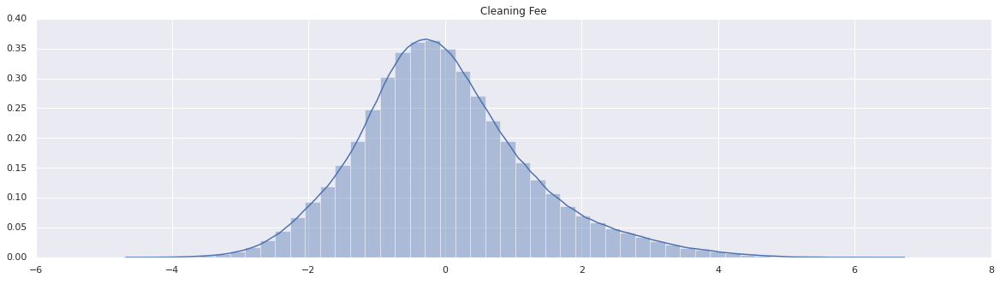

In [205]:
lasso = Lasso()
parameters = {'alpha': [1e-15,1e-10,1e-8,1e-3,1e-2,1,5,10,20,30,35,40]}
lasso_reg = GridSearchCV(lasso, parameters, scoring='neg_mean_squared_error', cv=5)
lasso_reg.fit(X_lr_train, y_lr_train)
y_pred3 = lasso_reg.predict(X_lr_test)

fcnPrintErrorMetrics(y_lr_test, y_pred3)

R2: 0.6810861093636604
MAE: 0.37441634022412473
MSE: 0.3229606568061501
RMSE: 0.5682962755518903


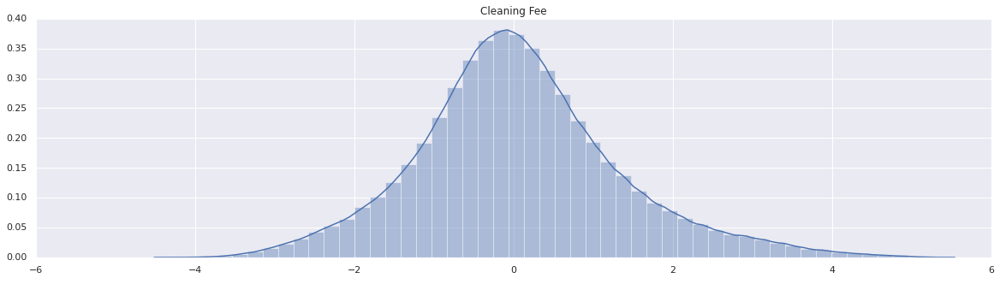

In [209]:
svr = SVR()
svr.fit(X_lr_train, y_lr_train)
y_pred4 = svr.predict(X_lr_test)

fcnPrintErrorMetrics(y_lr_test, y_pred4)

R2: 0.2514518463866713
MAE: 53.3339443235193
MSE: 7448.7958665422875
RMSE: 86.30640686844916


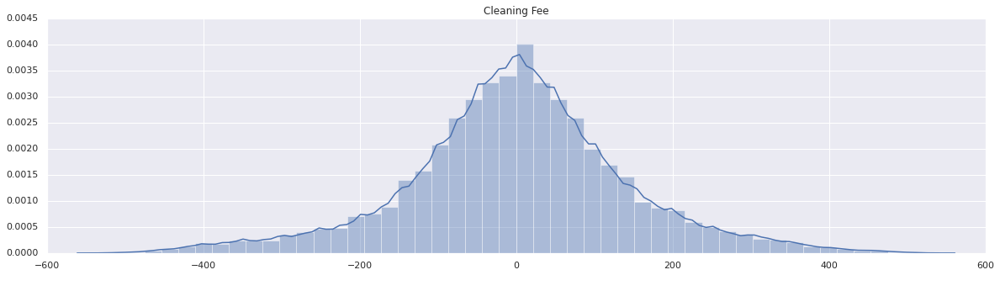

In [207]:
dt_reg = DecisionTreeRegressor()
dt_reg.fit(X_tree_train, y_tree_train)
y_pred5 = dt_reg.predict(X_tree_test)

fcnPrintErrorMetrics(y_tree_test, y_pred4)

R2: 0.66862384703781
MAE: 38.451785143726354
MSE: 3297.5210833670726
RMSE: 57.424046212079766


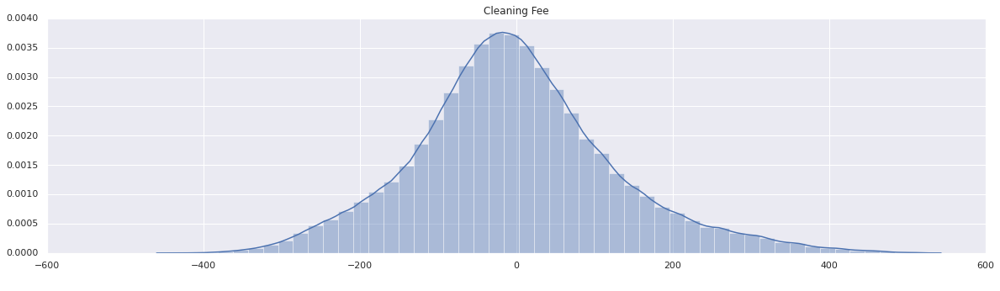

In [210]:
rf_reg = RandomForestRegressor()
rf_reg.fit(X_tree_train, y_tree_train)
y_pred6 = rf_reg.predict(X_tree_test)

fcnPrintErrorMetrics(y_tree_test, y_pred6)

R2: 0.2594477533762324
MAE: 72.28754453686457
MSE: 7369.2286688335
RMSE: 85.84421162101438


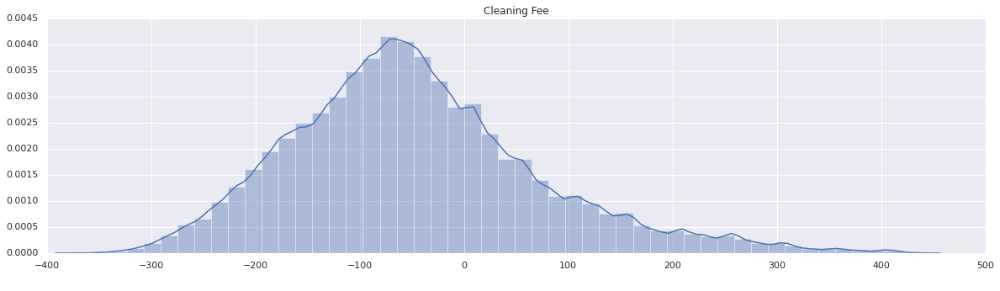

In [211]:
ab_reg = AdaBoostRegressor(loss = "linear")
ab_reg.fit(X_tree_train, y_tree_train)
y_pred7 = ab_reg.predict(X_tree_test)

fcnPrintErrorMetrics(y_tree_test, y_pred7)

R2: 0.6317603736198494
MAE: 43.612611154584485
MSE: 3664.3491719765043
RMSE: 60.533867974684256


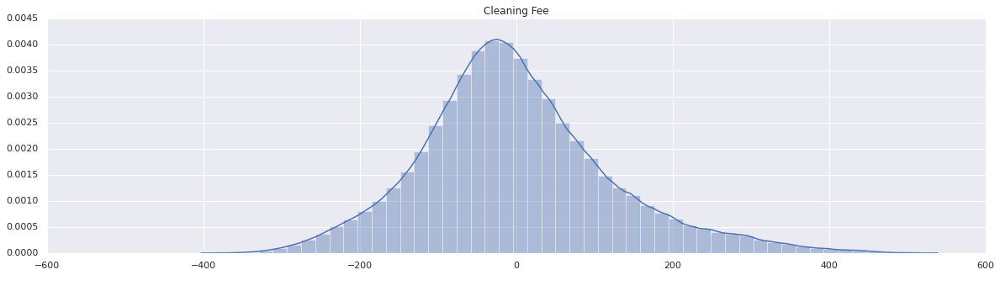

In [212]:
gb_reg = GradientBoostingRegressor(max_depth = 7, max_features = 4, n_estimators = 35)
gb_reg.fit(X_tree_train, y_tree_train)
y_pred8 = gb_reg.predict(X_tree_test)

fcnPrintErrorMetrics(y_tree_test, y_pred8)

[11:36:27] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
R2: 0.6408451263560109
MAE: 42.74392528426867
MSE: 3573.9468801492853
RMSE: 59.782496436241985


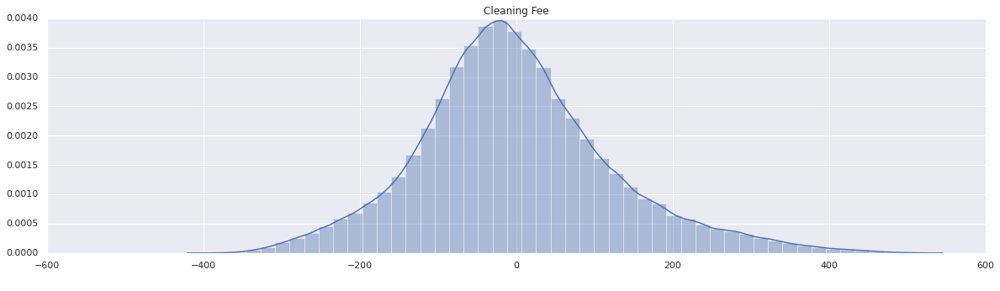

In [214]:
xgb_reg = XGBRegressor()
xgb_reg.fit(X_tree_train, y_tree_train)
y_pred9 = xgb_reg.predict(X_tree_test)

fcnPrintErrorMetrics(y_tree_test, y_pred9)

##### Random Forest, SVR and Xgboost seems to give us the best results and we can continue to select features and do hyperparameter optimization to extract better results.

### **4.3 Feature Selection**

In [216]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold
from sklearn.feature_selection import RFE, RFECV
from sklearn.feature_selection import SelectFromModel


In [219]:
estimator = SVR(kernel="linear")
selector = RFECV(estimator, step=1, cv=5)
selector = selector.fit(X_lr, y_lr)

In [233]:
print(selector.support_)
print(selector.ranking_)

[ True  True  True False  True  True  True  True  True  True  True False
 False False  True  True  True  True  True  True  True  True  True False
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True False  True  True  True  True False False False  True False
  True False False  True  True  True False  True  True False  True  True
  True]
[ 1  1  1  4  1  1  1  1  1  1  1  3  6 11  1  1  1  1  1  1  1  1  1  5
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  9  1  1  1  1 13  7  8  1  2
  1 14 10  1  1  1 15  1  1 12  1  1  1]


In [251]:
selected_feat = X_lr.columns[(selector.get_support())]
print('Total features: {}'.format((X_lr.shape[1])))
print('selected features: {}'.format(len(selected_feat)))
print('Selected Features : ', selected_feat)
print('Dropped Features', X_lr.columns[(~selector.get_support())])

Total features: 61
selected features: 47
Selected Features :  Index(['host_response_rate_pct', 'host_is_superhost', 'host_identity_verified',
       'host_listing_count', 'host_is_local', 'day', 'few_days', 'few_hours',
       'Bayview', 'Bernal Heights', 'Excelsior', 'Financial District',
       'Glen Park', 'Haight Ashbury', 'Inner Richmond', 'Inner Sunset',
       'Lakeshore', 'Marina', 'Mission', 'Noe Valley', 'North Beach',
       'Ocean View', 'Others', 'Outer Mission', 'Outer Richmond',
       'Outer Sunset', 'Pacific Heights', 'Parkside', 'Potrero Hill',
       'Russian Hill', 'South of Market', 'Visitacion Valley',
       'West of Twin Peaks', 'Hotel', 'Entire home/apt', 'Hotel room',
       'Private room', 'accommodates', 'bedrooms', 'guests_included',
       'extra_people', 'min_nights', 'number_of_reviews', 'listing_duration',
       'review_score', 'host_since_years', 'amenities_count'],
      dtype='object')
Dropped Features Index(['instant_bookable', 'Castro/Upper Market

In [228]:
lasso_reg.best_estimator_

Lasso(alpha=1e-08, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=False, positive=False, precompute=False, random_state=None,
      selection='cyclic', tol=0.0001, warm_start=False)

In [229]:
sel_ = SelectFromModel(Lasso(alpha=1e-08))
sel_.fit(X_lr, y_lr)


SelectFromModel(estimator=Lasso(alpha=1e-08, copy_X=True, fit_intercept=True,
                                max_iter=1000, normalize=False, positive=False,
                                precompute=False, random_state=None,
                                selection='cyclic', tol=0.0001,
                                warm_start=False),
                max_features=None, norm_order=1, prefit=False, threshold=None)

In [230]:
sel_.get_support()

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True])

In [253]:
X_lr_train, X_lr_test, y_lr_train, y_lr_test = train_test_split(X_lr[selected_feat].values, y_lr.values, test_size=0.2, random_state=42)
print('X_train.shape: ', X_lr_train.shape, '\tX_test.shape: ', X_lr_test.shape, '\nY_train.shape: ', y_lr_train.shape, '\tY_test.shape: ', y_lr_test.shape)

X_train.shape:  (4988, 47) 	X_test.shape:  (1247, 47) 
Y_train.shape:  (4988, 1) 	Y_test.shape:  (1247, 1)


R2: 0.6483719738152447
MAE: 0.3938899348756322
MSE: 0.356089908976635
RMSE: 0.5967326947441668


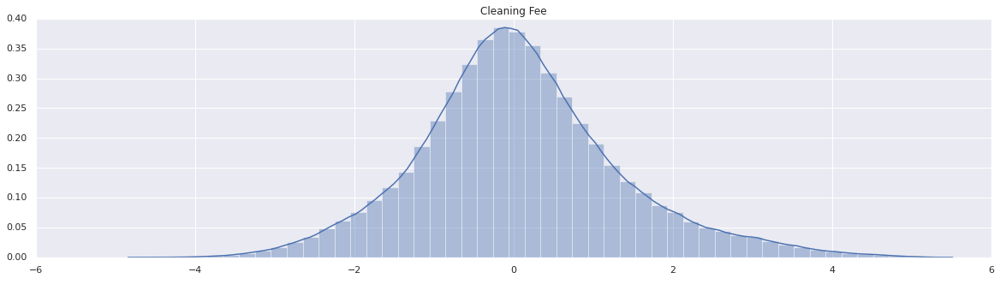

In [255]:
svr = SVR()
svr.fit(X_lr_train, y_lr_train)
y_pred4 = svr.predict(X_lr_test)

fcnPrintErrorMetrics(y_lr_test, y_pred4)

### **4.4 Hyperparameter Optimization**

In [259]:
def find_best_model(X, y):
    algos = {
        'random_forest': {
            'model': RandomForestRegressor(),
            'params': {
                "n_estimators" : [int(x) for x in np.linspace(start = 100, stop = 1000, num = 50)],
                "max_depth" : [int(x) for x in np.linspace(5, 30, num = 6)]         
            }
       },
        'xgboost': {
            'model': XGBRegressor(),
            'params': {
                'n_estimators': [100, 200, 300],
                'reg_alpha':[0.005, 0.01, 0.05],
                'gamma':[i/10.0 for i in range(0,5)],
                'min_child_weight':[6,8,10,12],
                'max_depth':[4,5,6]
            }
        }
    }    
    scores = []
    cv = ShuffleSplit(n_splits=5, test_size=0.2, random_state=0)
    for algo_name, config in algos.items():
        gs =  RandomizedSearchCV(config['model'], config['params'], cv=cv, return_train_score=False)
        gs.fit(X,y)
        scores.append({
            'model': algo_name,
            'best_score': gs.best_score_,
            'best_params': gs.best_params_
        })

    return pd.DataFrame(scores,columns=['model','best_score','best_params'])

model_scores = find_best_model(X_tree.values, y_tree.values)
model_scores

[14:18:38] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[14:18:40] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[14:18:42] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[14:18:44] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[14:18:46] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[14:18:48] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[14:18:50] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[14:18:53] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of re

,model,best_score,best_params
0,random_forest,0.632711,"{'n_estimators': 871, 'max_depth': 30}"
1,xgboost,0.657902,"{'reg_alpha': 0.05, 'n_estimators': 200, 'min_..."


##### Since Xgboost then to give the best score, we can select it to be the final model and save the trained model.

#### **4.5 Saving the Model**

Saving the final model in pickle file.

In [261]:
model_scores.iloc[1,2]

{'gamma': 0.4,
 'max_depth': 6,
 'min_child_weight': 12,
 'n_estimators': 200,
 'reg_alpha': 0.05}

In [264]:
xgb_final = XGBRegressor(gamma = 0.4, max_depth = 6, min_child_weight = 12, n_estimators = 200, reg_alpha = 0.05)
xgb_final.fit(X_tree.values, y_tree.values)

[14:38:14] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0.4,
             importance_type='gain', learning_rate=0.1, max_delta_step=0,
             max_depth=6, min_child_weight=12, missing=None, n_estimators=200,
             n_jobs=1, nthread=None, objective='reg:linear', random_state=0,
             reg_alpha=0.05, reg_lambda=1, scale_pos_weight=1, seed=None,
             silent=None, subsample=1, verbosity=1)

In [265]:
import pickle
import json

In [266]:
with open('airbnb_price_prediction.pickle','wb') as f:
    pickle.dump(xgb_final, f)

In [267]:
cat_features

['host_response_time',
 'neighbourhood',
 'property_type',
 'room_type',
 'cancellation_policy']

In [269]:
cat_feature_columns = {
    "host_response_time" : [col for col in le1.classes_], 
    "neighbourhood" : [col for col in le2.classes_],
    "property_type" : [col for col in le3.classes_], 
    "room_type" : [col for col in le4.classes_], 
    "cancellation_policy" : [col for col in le5.classes_], 
    "data_columns" : [col for col in X_tree.columns],
}

with open("columns.json", "w") as f:
    f.write(json.dumps(cat_feature_columns))

## **5. Conclusion**

After working with the dataset we were able to create a model that uses xgboost regressor to predict the price of the airbnb rentals based on certain features.

The model is able to explain 65% of the variance.